In [60]:
pip install yfinance

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [61]:
import yfinance as yf
import pandas as pd
import numpy as np
from bs4 import BeautifulSoup
import math
from numpy.linalg import eig
from tabulate import tabulate
import matplotlib.pyplot as plt



In [62]:
tickers_list = ['VFINX', 'VBMFX', 'VGSLX', 'VIMAX', 'VGTSX', 'VGENX', 'NEE', 'COP', 'CVX']
data = [np.zeros(252),np.zeros(252),np.zeros(252),np.zeros(252),np.zeros(252),np.zeros(252),np.zeros(252),np.zeros(252),np.zeros(252),np.zeros(252),np.zeros(252),np.zeros(252),np.zeros(252),np.zeros(252),np.zeros(252),np.zeros(252)]
#Get Data for all stocks by year
data[15] = (yf.download(tickers_list,'2006-01-01','2006-12-31')['Adj Close'])
data[14] = (yf.download(tickers_list,'2007-01-01','2007-12-31')['Adj Close'])
data[13] = (yf.download(tickers_list,'2008-01-01','2008-12-31')['Adj Close'])
data[12] = (yf.download(tickers_list,'2009-01-01','2009-12-31')['Adj Close'])
data[11] = (yf.download(tickers_list,'2010-01-01','2010-12-31')['Adj Close'])
data[10] = (yf.download(tickers_list,'2011-01-01','2011-12-31')['Adj Close'])
data[9] = (yf.download(tickers_list,'2012-01-01','2012-12-31')['Adj Close'])
data[8] = (yf.download(tickers_list,'2013-01-01','2013-12-31')['Adj Close'])
data[7] = (yf.download(tickers_list,'2014-01-01','2014-12-31')['Adj Close'])
data[6] = (yf.download(tickers_list,'2015-01-01','2015-12-31')['Adj Close'])
data[5] = (yf.download(tickers_list,'2016-01-01','2016-12-31')['Adj Close'])
data[4] = (yf.download(tickers_list,'2017-01-01','2017-12-31')['Adj Close'])
data[3] = (yf.download(tickers_list,'2018-01-01','2018-12-31')['Adj Close'])
data[2] = (yf.download(tickers_list,'2019-01-01','2019-12-31')['Adj Close'])
data[1] = yf.download(tickers_list,'2020-01-01','2020-12-31')['Adj Close']
data[0] = yf.download(tickers_list,'2021-01-01','2021-12-31')['Adj Close']
# Remove invalid values

returns = [np.zeros(252),np.zeros(252),np.zeros(252),np.zeros(252),np.zeros(252),np.zeros(252),np.zeros(252),np.zeros(252),np.zeros(252),np.zeros(252),np.zeros(252),np.zeros(252),np.zeros(252),np.zeros(252),np.zeros(252),np.zeros(252)]

for i in range(16):
  returns[i] = data[i].pct_change()
  returns[i].dropna(inplace = True)


returns[0].head()

[*********************100%***********************]  9 of 9 completed
[*********************100%***********************]  9 of 9 completed
[*********************100%***********************]  9 of 9 completed
[*********************100%***********************]  9 of 9 completed
[*********************100%***********************]  9 of 9 completed
[*********************100%***********************]  9 of 9 completed
[*********************100%***********************]  9 of 9 completed
[*********************100%***********************]  9 of 9 completed
[*********************100%***********************]  9 of 9 completed
[*********************100%***********************]  9 of 9 completed
[*********************100%***********************]  9 of 9 completed
[*********************100%***********************]  9 of 9 completed
[*********************100%***********************]  9 of 9 completed
[*********************100%***********************]  9 of 9 completed
[*********************100%********

,COP,CVX,NEE,VBMFX,VFINX,VGENX,VGSLX,VGTSX,VIMAX
Date,,,,,,,,,
2021-01-05,0.057367,0.027033,0.007410,-0.001721,0.007204,0.025280,0.001547,0.013882,0.009674
2021-01-06,0.039914,0.032184,0.048950,-0.005173,0.005727,0.030587,0.002146,0.003043,0.015903
2021-01-07,0.027350,0.004677,0.010965,-0.002600,0.015061,0.005148,-0.001199,0.006066,0.016388
2021-01-08,0.000000,0.009532,0.023206,-0.000869,0.005610,0.004218,0.009861,0.011055,0.003879
2021-01-11,0.014765,0.005709,-0.017749,-0.001739,-0.006570,-0.005101,-0.014180,-0.010437,-0.002387


In [63]:
# Calc Mean and Cov
M = [[],[],[]]
label = ['VFINX','VBMFX','VGSLX','VIMAX','VGENX','VGSTX','COP','NEE','CVX']
yearlabel = ['2021','2020','2019','2018','2017','2016','2015','2014','2013','2012','2011','2010','2009','2008','2007','2006']
grouplabel = ['Group A','Group AB','Group ABC']
combined = [[],[],[]]
for i in range(16):
  for j in range(len(returns[i])):
    combined[0].append([returns[i]['VFINX'][j],returns[i]['VBMFX'][j],returns[i]['VGSLX'][j]])
    combined[1].append([returns[i]['VFINX'][j],returns[i]['VBMFX'][j],returns[i]['VGSLX'][j],
              returns[i]['VIMAX'][j],returns[i]['VGTSX'][j],returns[i]['VGENX'][j]])
    combined[2].append([returns[i]['VFINX'][j],returns[i]['VBMFX'][j],returns[i]['VGSLX'][j],
              returns[i]['VIMAX'][j],returns[i]['VGTSX'][j],returns[i]['VGENX'][j],
              returns[i]['NEE'][j],returns[i]['COP'][j],returns[i]['CVX'][j]])


for i in range(16):
  M[0].append([returns[i]['VFINX'].sum()*(1/len(returns[i])),returns[i]['VBMFX'].sum()*(1/len(returns[i])),returns[i]['VGSLX'].sum()*(1/len(returns[i]))])
  M[1].append([returns[i]['VFINX'].sum()*(1/len(returns[i])),returns[i]['VBMFX'].sum()*(1/len(returns[i])),returns[i]['VGSLX'].sum()*(1/len(returns[i])),
              returns[i]['VIMAX'].sum()*(1/len(returns[i])),returns[i]['VGTSX'].sum()*(1/len(returns[i])),returns[i]['VGENX'].sum()*(1/len(returns[i]))])
  M[2].append([returns[i]['VFINX'].sum()*(1/len(returns[i])),returns[i]['VBMFX'].sum()*(1/len(returns[i])),returns[i]['VGSLX'].sum()*(1/len(returns[i])),
              returns[i]['VIMAX'].sum()*(1/len(returns[i])),returns[i]['VGTSX'].sum()*(1/len(returns[i])),returns[i]['VGENX'].sum()*(1/len(returns[i])),
              returns[i]['NEE'].sum()*(1/len(returns[i])),returns[i]['COP'].sum()*(1/len(returns[i])),returns[i]['CVX'].sum()*(1/len(returns[i]))])

V = [[],[],[]]
for i in range(16): 
  V[0].append((returns[i][['VFINX','VBMFX','VGSLX']]).cov())
  V[1].append((returns[i][['VFINX', 'VBMFX', 'VGSLX', 'VIMAX', 'VGTSX', 'VGENX']]).cov())
  V[2].append(returns[i].cov())



In [64]:
# Rolling data
# Rolling split into quarterly, so 4 datapts per year so total 64 per year (64*3 = 192 total)
def calc_A_m(vec,OneVect): # A = T(ones)* Inv(V)* ones
    OneVectorTrans = np.transpose(OneVect)
    inverse = np.linalg.inv(vec)
    inverse = np.matmul(OneVectorTrans,inverse)
    inverse = np.matmul(inverse,OneVect)
    return inverse

def calc_B_m(vec,OneVect,m): #B = T(ones)* Inv(V)* means
    OneVectorTrans = np.transpose(OneVect)
    inverse = np.linalg.inv(vec)
    inverse = np.matmul(OneVectorTrans,inverse)
    inverse = np.matmul(inverse,m)
    return inverse

def calc_C_m(vec,m):         #C = T(means)* Inv(V)* means
    mTrans = np.transpose(m)
    inverse = np.linalg.inv(vec)
    inverse = np.matmul(mTrans,inverse)
    inverse = np.matmul(inverse,m)
    return inverse

roll_means = []
roll_var = []
roll_o = []
roll_u = []
roll_v = []
roll_ret = []

for i in range(16):
    means = [[],[],[]]
    var = [[],[],[]]
    a = [[],[],[]]
    b = [[],[],[]]
    c = [[],[],[]]
    o = [[],[],[]]
    u = [[],[],[]]
    v = [[],[],[]]
    for dset in np.array_split(returns[i], 4):
        means[0].append([dset['VFINX'].sum()*(1/len(dset)),dset['VBMFX'].sum()*(1/len(dset)),dset['VGSLX'].sum()*(1/len(dset))])
    
        means[1].append([dset['VFINX'].sum()*(1/len(dset)),dset['VBMFX'].sum()*(1/len(dset)),dset['VGSLX'].sum()*(1/len(dset)),
              dset['VIMAX'].sum()*(1/len(dset)),dset['VGTSX'].sum()*(1/len(dset)),dset['VGENX'].sum()*(1/len(dset))])
        means[2].append([dset['VFINX'].sum()*(1/len(dset)),dset['VBMFX'].sum()*(1/len(dset)),dset['VGSLX'].sum()*(1/len(dset)),
              dset['VIMAX'].sum()*(1/len(dset)),dset['VGTSX'].sum()*(1/len(dset)),dset['VGENX'].sum()*(1/len(dset)),
              dset['NEE'].sum()*(1/len(dset)),dset['COP'].sum()*(1/len(dset)),dset['CVX'].sum()*(1/len(dset))])
        var[0].append((dset[['VFINX','VBMFX','VGSLX']]).cov())
        var[1].append((dset[['VFINX', 'VBMFX', 'VGSLX', 'VIMAX', 'VGTSX', 'VGENX']]).cov())
        var[2].append(dset.cov())
        roll_ret.append(dset)

        for i in range(3):
            
            a[i].append(calc_A_m(var[i][-1],np.ones(len(means[i][-1]))))
            b[i].append(calc_B_m(var[i][-1],np.ones(len(means[i][-1])),means[i][-1]))
            c[i].append(calc_C_m(var[i][-1],means[i][-1]))
            
        for i in range(3):
            o[i].append(1/math.sqrt(a[i][-1]))
            u[i].append((b[i][-1]/a[i][-1]))
            v[i].append(math.sqrt(((a[i][-1]*c[i][-1]) - b[i][-1]**2)/a[i][-1]))
        

    roll_means.append(means)
    roll_var.append(var)
    roll_o.append(o)
    roll_u.append(u)
    roll_v.append(v)

rollvarf = np.zeros((16,4,9,9))

for i in range(16):
  for k in range(4):
    rollvarf[i][k] = (roll_var[i][2][k])

for i in range(len(roll_ret)):
  roll_ret[i] = roll_ret[i].to_numpy()





In [65]:
v1 = [[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[]]

m1 = [[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[]]

for i in range(16):
    v1[i] = V[0][i].to_numpy()
    m1[i] = M[0][i]
    v1[i + 16] = V[1][i].to_numpy()
    m1[i + 16] = M[1][i]
    v1[i + 32] = V[2][i].to_numpy()
    m1[i + 32] = M[2][i]


In [66]:
def calc_A(i,vec,OneVect): # A = T(ones)* Inv(V)* ones
    OneVectorTrans = np.transpose(OneVect)
    inverse = np.linalg.inv(vec[i])
    inverse = np.matmul(OneVectorTrans,inverse)
    inverse = np.matmul(inverse,OneVect)
    return inverse

def calc_B(i,vec,OneVect,m): #B = T(ones)* Inv(V)* means
    OneVectorTrans = np.transpose(OneVect)
    inverse = np.linalg.inv(vec[i])
    inverse = np.matmul(OneVectorTrans,inverse)
    inverse = np.matmul(inverse,m)
    return inverse

def calc_C(i,vec,m):         #C = T(means)* Inv(V)* means
    mTrans = np.transpose(m)
    inverse = np.linalg.inv(vec[i])
    inverse = np.matmul(mTrans,inverse)
    inverse = np.matmul(inverse,m)
    return inverse

formatter = "{0:.4f}"

OneVector = np.array([[1],[1],[1]])
OneVectorTrans = np.transpose(OneVector)
mt = [[],[],[],[],[],[],[],[],[]]

fst = []
fct = []
formatter = "{0:.4f}"

a = []
b = []
c = []
o = []
u = []
v = []


for i in  range(48):
    a.append(calc_A(i,v1,np.ones(len(m1[i]))))
    b.append(calc_B(i,v1,np.ones(len(m1[i])),m1[i]))
    c.append(calc_C(i,v1,m1[i]))



for i in range(48):
    o.append(1/math.sqrt(a[i]))
    u.append((b[i]/a[i]))
    v.append(math.sqrt(((a[i]*c[i]) - b[i]**2)/a[i]))

table = []
counter = 0

for i in range(3):
  table.append([grouplabel[i]])
  for j in range(16):   
    table[i].append(o[counter])
    counter = counter + 1
header = ['σmv']
header = header + yearlabel
print(tabulate(table,headers = header))

table = []
counter = 0
for i in range(3):
  table.append([grouplabel[i]])
  for j in range(16):   
    table[i].append(u[counter])
    counter = counter + 1 
header = ['µmv']
header = header + yearlabel
print(tabulate(table,headers = header))

table = []
counter = 0
for i in range(3):
  table.append([grouplabel[i]])
  for j in range(16):   
    table[i].append(v[counter])
    counter = counter + 1 
header = ['νmv']
header = header + yearlabel
print(tabulate(table,headers = header))


σmv              2021        2020        2019        2018        2017        2016        2015        2014        2013        2012        2011        2010        2009        2008        2007        2006
---------  ----------  ----------  ----------  ----------  ----------  ----------  ----------  ----------  ----------  ----------  ----------  ----------  ----------  ----------  ----------  ----------
Group A    0.00225345  0.00284262  0.00167348  0.00157851  0.00138657  0.00179644  0.00197777  0.00140165  0.00176183  0.00129725  0.00183176  0.00195151  0.00258412  0.00348738  0.00211894  0.00203964
Group AB   0.0020599   0.00282329  0.00163658  0.00155691  0.00136394  0.00178881  0.00195467  0.00140061  0.00172624  0.0012942   0.00179408  0.00189998  0.00256178  0.00345392  0.00210206  0.00201572
Group ABC  0.00200586  0.0027804   0.00162332  0.00153941  0.00134445  0.0017122   0.00192804  0.0013365   0.00172382  0.00128274  0.00175826  0.00189531  0.00253879  0.00340631  0.00208136  0

In [67]:
#Part 3
fmv = []
formatter = "{0:.4f}"

for i in  range(48):
    inverse = (1/a[i]) * np.linalg.inv(v1[i])
    inverse = np.matmul(inverse,np.ones(len(m1[i])))
    fmv.append(inverse)


table = []
counter = 0
for i in range(3):
  table.append([grouplabel[i]])
  for j in range(16):   
    table[i].append(fmv[counter])
    counter = counter + 1
header = ['fmv']
header = header + yearlabel
print(tabulate(table,headers = header))

fmv        2021                                                                       2020                                                                       2019                                                                       2018                                                                       2017                                                                       2016                                                                       2015                                                                       2014                                                                       2013                                                                       2012                                                                     2011                                                                       2010                                                                       2009                                                                       2008            

In [68]:
Amaxmv = np.zeros(16)
ABmaxmv = np.zeros(16)
ABCmaxmv = np.zeros(16)

dsA = -1000
dsAB = -1000
dsABC = -1000
ufmvA = np.zeros(64)
ufmvAB = np.zeros(64)
ufmvABC = np.zeros(64)

counter = 0;
for j in range(16):
  dsA = -1000
  dsAB = -1000
  dsABC = -1000
  for i in range(250): 
   dsA = max(dsA,np.matmul(np.array(combined[0][counter]).T,fmv[j]) * (-1)) 
   dsAB = max(dsAB,np.matmul(np.array(combined[1][counter]).T,fmv[j + 16])*(-1)) 
   dsABC = max(dsABC,np.matmul(np.array(combined[2][counter]).T,fmv[j + 32])*(-1)) 
   ufmvA[j] = ufmvA[j] + ((1/250) * np.matmul(np.array(combined[0][counter]).T,fmv[j]))
   ufmvAB[j] = ufmvAB[j] + ((1/250) * np.matmul(np.array(combined[1][counter]).T,fmv[j + 16]))
   ufmvABC[j] = ufmvABC[j] + ((1/250) * np.matmul(np.array(combined[2][counter]).T,fmv[j + 32]))
   counter = counter + 1;

  Amaxmv[j] = dsA + ufmvA[j]/(1 + ufmvA[j])
  ABmaxmv[j] = dsAB + ufmvAB[j]/(1 + ufmvAB[j])
  ABCmaxmv[j] = dsABC + ufmvABC[j]/(1 + ufmvABC[j])


table = []  
table.append(["A"])
for j in range(16):   
  table[0].append(Amaxmv[j])
table.append(["AB"])
for j in range(16):   
  table[1].append(ABmaxmv[j])
table.append(["ABC"]) 
for j in range(16):   
  table[2].append(ABCmaxmv[j])

header = ['fmv liquidity']
header = header + yearlabel
print(tabulate(table,headers = header))

fmv liquidity          2021       2020        2019        2018        2017        2016        2015        2014        2013        2012        2011        2010        2009       2008        2007        2006
---------------  ----------  ---------  ----------  ----------  ----------  ----------  ----------  ----------  ----------  ----------  ----------  ----------  ----------  ---------  ----------  ----------
A                0.00882093  0.0169874  0.00524946  0.00426546  0.00433315  0.00578926  0.00712123  0.0044186   0.00739872  0.00510783  0.00487472  0.00670906  0.00716237  0.0118319  0.00749807  0.00471713
AB               0.00758871  0.0160214  0.00514975  0.00437837  0.0042186   0.00561347  0.00701082  0.00441455  0.00701206  0.00491385  0.00426029  0.00633526  0.00655694  0.0124346  0.00759455  0.0048715
ABC              0.0273909   0.124347   0.031103    0.0359009   0.018326    0.0535418   0.0402885   0.0250125   0.0291277   0.0316847   0.0779424   0.0410263   0.0648754   0.100

In [69]:
leveragemv = np.zeros(48) 
for i in range(48): 
   leveragemv[i] = .5*(np.linalg.norm(fmv[i],1) - 1)

table = []
counter = 0
for i in range(3):
  table.append([grouplabel[i]])
  for j in range(16):   
    table[i].append(leveragemv[counter])
    counter = counter + 1
header = ['fmv leverage']
header = header + yearlabel
print(tabulate(table,headers = header))


fmv leverage         2021       2020       2019       2018       2017       2016      2015       2014      2013        2012       2011       2010       2009        2008       2007       2006
--------------  ---------  ---------  ---------  ---------  ---------  ---------  --------  ---------  --------  ----------  ---------  ---------  ---------  ----------  ---------  ---------
Group A         0          0.0318508  0.0814118  0.0492483  0.0621453  0.0857065  0.10295   0.0461463  0.134992  0.00781119  0.0761423  0.0376182  0.0252143  0.00560152  0.011543   0.0251706
Group AB        0.0390592  0.0791734  0.103996   0.0565694  0.140229   0.116767   0.138402  0.0540836  0.288981  0.0413964   0.195225   0.187221   0.0780988  0.0619287   0.0721613  0.137984
Group ABC       0.10521    0.102499   0.127134   0.0920718  0.157725   0.178812   0.160087  0.0981661  0.282858  0.1067      0.170331   0.183823   0.0977359  0.151525    0.111844   0.235417


The entries for the first two matrices are all contained within the matrix for the third group, since all funds within the first two are in the third. This is easily visible if you follow down the diagonals of the group A and group AB matrices.

In [70]:

usi = [.0039,.001,.0159,.0263,.0174,.0083,.0062,.0022,.0012,.0015,.0011,.0027,.0045,.0036,.0349,.0509]
ucl = []
for i in range(len(usi)):
  ucl.append(usi[i] + .0003)

tft = 1/252
for i in range(16):
    usi[i] = (1+usi[i])**(tft)-1
    ucl[i] = (1+ucl[i])**(tft)-1




In [71]:
print((usi))
print((ucl))
print(m1[0])

[1.5446209431724256e-05, 3.966279028766451e-06, 6.260084472953231e-05, 0.00010302158282526896, 6.845612637285114e-05, 3.280111102821337e-05, 2.4527519346673188e-05, 8.720607641343747e-06, 4.759061227099792e-06, 5.947938814809817e-06, 4.362689847159373e-06, 1.0699904655186998e-05, 1.781724314131594e-05, 1.4260163223367428e-05, 0.00013613943951340524, 0.0001970310743006909]
[1.6631902667541e-05, 5.155393176359269e-06, 6.377258964507249e-05, 0.0001041815024842574, 6.962615083461188e-05, 3.398165141277332e-05, 2.5710513436916216e-05, 9.908303843175759e-06, 5.947938814809817e-06, 7.136461739776223e-06, 5.551685702931408e-06, 1.1887011045930151e-05, 1.900223106310328e-05, 1.5446209431724256e-05, 0.00013728975974358626, 0.00019816395231186945]
[0.00110765673821855, -7.733522767640544e-05, 0.0015283421676658064]


In [72]:
#Part 4
vs = []
vc = []
us = []
uc = []
os = []
oc = []


for i in range(48):
    vs.append(np.sqrt(np.matmul(np.matmul(m1[i] - (usi[i%16] * np.ones(len(m1[i]))).T,np.linalg.inv(v1[i])),(m1[i] - (usi[i%16] * np.ones(len(m1[i])))))))
    vc.append(np.sqrt(np.matmul(np.matmul(m1[i] - (ucl[i%16] * np.ones(len(m1[i]))).T,np.linalg.inv(v1[i])),(m1[i] - (usi[i%16] * np.ones(len(m1[i]))).T))))

    us.append(usi[i%16] + (vs[i]**2 * o[i]**2)/(u[i] - usi[i%16]))
    uc.append(ucl[i%16] + (vc[i]**2 * o[i]**2)/(u[i] - ucl[i%16]))

    os.append(abs(us[i] - usi[i%16])/vs[i])
    oc.append(abs(uc[i] - ucl[i%16])/vc[i])


w_tsi = np.zeros(48)
w_asi = np.zeros(48)
w_tcl = np.zeros(48)
w_acl = np.zeros(48)


for i in range (48):
    w_tsi[i] = formatter.format((v[i]**2)/(vs[i]**2))
    w_tcl[i] = formatter.format((v[i]**2)/(vc[i]**2))
    w_asi[i] = formatter.format(v[i]/(vs[i]))
    w_acl[i] = formatter.format(v[i]/(vc[i]))




In [73]:
metriclabels = ['usi', 'vsi','ωsitg','ωsias','ucl', 'vcl','ωcltg','ωclas']

table = []
counter = 0

table.append([metriclabels[0]])
for j in range(16):   
  table[0].append(usi[j])


table.append([metriclabels[1]])
for j in range(16):   
  table[1].append(vs[j])

table.append([metriclabels[2]])
for j in range(16):   
  table[2].append(w_tsi[j])


table.append([metriclabels[3]])
for j in range(16):   
  table[3].append(w_asi[j])

table.append([metriclabels[4]])
for j in range(16):   
  table[4].append(ucl[j])


table.append([metriclabels[5]])
for j in range(16):   
  table[5].append(vc[j])

table.append([metriclabels[6]])
for j in range(16):   
  table[6].append(w_tcl[j])


table.append([metriclabels[7]])
for j in range(16):   
  table[7].append(w_acl[j])


header = ['Group A']


header = header + yearlabel
print(tabulate(table,headers = header))

Group A           2021         2020         2019         2018         2017         2016         2015         2014         2013         2012         2011         2010         2009         2008         2007         2006
---------  -----------  -----------  -----------  -----------  -----------  -----------  -----------  -----------  -----------  -----------  -----------  -----------  -----------  -----------  -----------  -----------
usi        1.54462e-05  3.96628e-06  6.26008e-05  0.000103022  6.84561e-05  3.28011e-05  2.45275e-05  8.72061e-06  4.75906e-06  5.94794e-06  4.36269e-06  1.06999e-05  1.78172e-05  1.42602e-05  0.000136139  0.000197031
vsi        0.171252     0.13023      0.235855     0.0790396    0.210417     0.0803122    0.0180754    0.204545     0.201482     0.164836     0.144844     0.134647     0.114885     0.0794537    0.112176     0.104859
ωsitg      0.9919       0.2294       0.2116       0.0586       0.3757       0.3729       0.6232       0.4264       0.8565       0.0

In [74]:
metriclabels = ['usi', 'vsi','ωsitg','ωsias','ucl', 'vcl','ωcltg','ωclas']

table = []
counter = 0

table.append([metriclabels[0]])
for j in range(16):   
  table[0].append(usi[j])


table.append([metriclabels[1]])
for j in range(16):   
  table[1].append(vs[j + 16])

table.append([metriclabels[2]])
for j in range(16):   
  table[2].append(w_tsi[j + 16])


table.append([metriclabels[3]])
for j in range(16):   
  table[3].append(w_asi[j + 16])

table.append([metriclabels[4]])
for j in range(16):   
  table[4].append(ucl[j])


table.append([metriclabels[5]])
for j in range(16):   
  table[5].append(vc[j + 16])

table.append([metriclabels[6]])
for j in range(16):   
  table[6].append(w_tcl[j + 16])


table.append([metriclabels[7]])
for j in range(16):   
  table[7].append(w_acl[j + 16])


header = ['Group AB USI']


header = header + yearlabel
print(tabulate(table,headers = header))

Group AB USI           2021         2020         2019         2018         2017         2016         2015         2014         2013         2012         2011         2010         2009         2008         2007         2006
--------------  -----------  -----------  -----------  -----------  -----------  -----------  -----------  -----------  -----------  -----------  -----------  -----------  -----------  -----------  -----------  -----------
usi             1.54462e-05  3.96628e-06  6.26008e-05  0.000103022  6.84561e-05  3.28011e-05  2.45275e-05  8.72061e-06  4.75906e-06  5.94794e-06  4.36269e-06  1.06999e-05  1.78172e-05  1.42602e-05  0.000136139  0.000197031
vsi             0.220189     0.205815     0.238738     0.17372      0.251377     0.123841     0.0966412    0.276646     0.244836     0.208323     0.210728     0.175719     0.149322     0.135596     0.170267     0.151635
ωsitg           0.9992       0.6639       0.3032       0.6767       0.6944       0.6892       0.9961       0.69

In [75]:
metriclabels = ['usi', 'vsi','ωsitg','ωsias','ucl', 'vcl','ωcltg','ωclas']

table = []
counter = 0

table.append([metriclabels[0]])
for j in range(16):   
  table[0].append(usi[j])


table.append([metriclabels[1]])
for j in range(16):   
  table[1].append(vs[j + 32])

table.append([metriclabels[2]])
for j in range(16):   
  table[2].append(w_tsi[j + 32])


table.append([metriclabels[3]])
for j in range(16):   
  table[3].append(w_asi[j + 32])

table.append([metriclabels[4]])
for j in range(16):   
  table[4].append(ucl[j])


table.append([metriclabels[5]])
for j in range(16):   
  table[5].append(vc[j + 32])

table.append([metriclabels[6]])
for j in range(16):   
  table[6].append(w_tcl[j + 32])


table.append([metriclabels[7]])
for j in range(16):   
  table[7].append(w_acl[j + 32])


header = ['Group ABC USI']


header = header + yearlabel
print(tabulate(table,headers = header))

Group ABC USI           2021         2020         2019         2018         2017         2016         2015         2014         2013         2012         2011         2010         2009         2008         2007         2006
---------------  -----------  -----------  -----------  -----------  -----------  -----------  -----------  -----------  -----------  -----------  -----------  -----------  -----------  -----------  -----------  -----------
usi              1.54462e-05  3.96628e-06  6.26008e-05  0.000103022  6.84561e-05  3.28011e-05  2.45275e-05  8.72061e-06  4.75906e-06  5.94794e-06  4.36269e-06  1.06999e-05  1.78172e-05  1.42602e-05  0.000136139  0.000197031
vsi              0.772807     0.498238     0.649786     0.508423     0.621682     0.49277      0.301744     0.451631     0.60898      0.506787     0.604615     0.525162     0.765971     0.755272     0.357613     0.185857
ωsitg            0.5982       0.5305       0.1901       0.6275       0.38         0.7877       0.9678      

In [76]:
#Part 5

Amaxq = []


dsA = -1000
dsAB = -1000
dsABC = -1000
ufmvA = np.zeros(64)
ufmvAB = np.zeros(64)
ufmvABC = np.zeros(64)


counter = 0
for j in range(16):
  for i in range(3):
    dsA = -1000
    for k in range(252):
      dsA = max(dsA,np.matmul(np.array(combined[0][k]).T,np.identity(3)[i]) * (-1)) 
    
    Amaxq.append((dsA + m1[j][i])/(m1[j][i] + 1))
  




In [77]:
#Sharpe

def get_met(mean,usi,vol,vsi): # νsi^2 was used in fst calculations
  ratio = (mean - usi)/vol
  met = (ratio/vsi)
  if met <= 0:
    met = 0
  
  return (1-met)

arr = []

for i in range(3):
  for j in range(16):
    v19 = np.sqrt(v1[j][i][i])
    arr.append(formatter.format(get_met(m1[j][i],usi[j%16]/253,v19,vs[i])))




In [78]:

ueff = []
prox = []
#Efficiency/Proximity
for i in range(3):
  for j in range(16):
    u_new = m1[j][i]
    o_new = math.sqrt(v1[j][i][i])

    uif = u[j] - v[j] * math.sqrt(o_new - o[j]**2)
    uef = u[j] + v[j] * math.sqrt(o_new - o[j]**2)

    ueff.append((uef - u_new)/(uef - uif))
    o_n = (o[j]**2 + ((m1[j][i] - u[j])/v[j]) ** 2)
    prox.append(math.sqrt(1 - (o_n)/v1[j][i][i]))




In [79]:
metriclabels = ['ωδi', 'ωρi','ωµi','ωσ']
table = []
counter = 0

table.append([metriclabels[0]])
for j in range(16):   
    table[0].append(Amaxq[j])
table.append([metriclabels[1]])
for j in range(16):   
    table[1].append(arr[j])

table.append([metriclabels[2]])
for j in range(16):   
    table[2].append(ueff[j])

table.append([metriclabels[3]])
for j in range(16):   
    table[3].append(prox[j])


header = ['Group A VFINX tangent,assymptope, etc']
header = header + yearlabel
print(tabulate(table,headers = header))


Group A VFINX tangent,assymptope, etc        2021        2020       2019       2018         2017       2016       2015        2014       2013       2012        2011       2010       2009        2008       2007       2006
---------------------------------------  --------  ----------  ---------  ---------  -----------  ---------  ---------  ----------  ---------  ---------  ----------  ---------  ---------  ----------  ---------  ---------
ωδi                                      0.026761  0.00699681  0.0303817  0.0265057   0.00734874  0.0290846  0.0267583  0.00739938  0.0299669  0.0254912  0.00706432  0.0287152  0.0264223  0.00721082  0.0290909  0.0262085
ωρi                                      0.2133    0.7733      0.182      1          -0.0589      0.6162     0.9193     0.5018      0.1252     0.6364     0.9443      0.7139     0.6582     1           0.8305     0.5013
ωµi                                      0.4658    0.471954    0.464088   0.545019    0.472409    0.455816   0.452959  

In [80]:
metriclabels = ['ωδi', 'ωρi','ωµi','ωσ']
table = []
counter = 0

table.append([metriclabels[0]])
for j in range(16):   
    table[0].append(Amaxq[j + 16])
table.append([metriclabels[1]])
for j in range(16):   
    table[1].append(arr[j + 16])

table.append([metriclabels[2]])
for j in range(16):   
    table[2].append(ueff[j + 16])

table.append([metriclabels[3]])
for j in range(16):   
    table[3].append(prox[j + 16])


header = ['Group A VBMFX tangent,assymptope, etc']
header = header + yearlabel
print(tabulate(table,headers = header))

Group A VBMFX tangent,assymptope, etc          2021       2020        2019        2018       2017       2016        2015       2014       2013        2012       2011       2010       2009       2008       2007        2006
---------------------------------------  ----------  ---------  ----------  ----------  ---------  ---------  ----------  ---------  ---------  ----------  ---------  ---------  ---------  ---------  ---------  ----------
ωδi                                      0.00716648  0.0293197   0.0258148  0.00706185  0.0290231  0.0262762  0.00727863  0.0300228  0.0266778  0.00699523  0.0290117  0.0261645  0.0072417  0.0294983  0.0258195  0.00737416
ωρi                                      1           0.3139     -0.1231     1           0.4324     0.6803     1           0.1058     1          0.2605      0.1463     0.3382     0.3378     0.6531     0.2627     0.3977
ωµi                                      0.507614    0.507459    0.508265   0.494653    0.514434   0.511523   0.5100

In [81]:
metriclabels = ['ωδi', 'ωρi','ωµi','ωσ']
table = []
counter = 0

table.append([metriclabels[0]])
for j in range(16):   
    table[0].append(Amaxq[j + 32])
table.append([metriclabels[1]])
for j in range(16):   
    table[1].append(arr[j + 32])

table.append([metriclabels[2]])
for j in range(16):   
    table[2].append(ueff[j + 32])

table.append([metriclabels[3]])
for j in range(16):   
    table[3].append(prox[j + 32])


header = ['Group A VGSLX tangent,assymptope, etc']
header = header + yearlabel
print(tabulate(table,headers = header))

Group A VGSLX tangent,assymptope, etc        2021       2020        2019       2018       2017        2016       2015       2014        2013       2012       2011        2010       2009       2008        2007        2006
---------------------------------------  --------  ---------  ----------  ---------  ---------  ----------  ---------  ---------  ----------  ---------  ---------  ----------  ---------  ---------  ----------  ----------
ωδi                                      0.029319  0.0262259  0.00729014  0.0300571  0.0266574  0.00732186  0.0309118  0.0242136  0.00725091  0.0279467  0.0259692  0.00730839  0.0282286  0.0262044  0.00723938  0.0299753
ωρi                                      0.292     0.9699     0.3845      1          0.8696     0.8291      0.9504     0.3169     0.9502      0.6964     0.9037     0.7146      0.7928     1          1           0.4833
ωµi                                      0.454692  0.506788   0.463616    0.544466   0.504955   0.471895    0.458135   0.

In [82]:
#FST/FCT part 6/7

OneVector = np.array([[1],[1],[1]])

for i in  range(48):
    inverse = (o[i]**2/(u[i] - usi[i%16])) * np.linalg.inv(v1[i])
    fst.append(np.matmul(inverse,(m1[i] - usi[i%16]*np.ones(len(m1[i])))))
    inverse = (o[i]**2/(u[i] - ucl[i%16])) * np.linalg.inv(v1[i])
    fct.append(np.matmul(inverse,(m1[i] - ucl[i%16]*np.ones(len(m1[i])))))#FCT,FST
  

for i in range(48):
  for x in range(len(fst[i])):
    fst[i][x] = formatter.format(fst[i][x])
    fct[i][x] = formatter.format(fct[i][x])


leveragest = np.zeros(48) 
for i in range(48): 
   leveragest[i] = .5*(np.linalg.norm(fst[i],1) - 1)
leveragect = np.zeros(48) 
for i in range(48): 
   leveragect[i] = .5*(np.linalg.norm(fct[i],1) - 1)

def get_met(mean,usi,vol,vsi): # νsi^2 was used in fst calculations
  ratio = (mean - usi)/vol
  met = (ratio/vsi)
  if met <= 0:
    met = 0
  
  return (1-met)

arr = []

for i in range(9):#Sharpe
  f = fct[i]
  for j in range(32,48):
    v19 = np.sqrt(v1[j][i][i])
    arr.append(formatter.format(get_met(m1[j][i],usi[j%16]/253,v19,vs[i])))

Amaxst = np.zeros(16)
ABmaxst = np.zeros(16)
ABCmaxst = np.zeros(16)
 
dsA = -1000
dsAB = -1000
dsABC = -1000

ufstA = np.zeros(64)
ufstAB = np.zeros(64)
ufstABC = np.zeros(64)

counter = 0
for j in range(16):
  dsA = -1000
  dsAB = -1000
  dsABC = -1000
  for i in range(250): 
   dsA = max(dsA,np.matmul(np.array(combined[0][counter]).T,fst[j]) * (-1)) 
   dsAB = max(dsAB,np.matmul(np.array(combined[1][counter]).T,fst[j + 16])*(-1)) 
   dsABC = max(dsABC,np.matmul(np.array(combined[2][counter]).T,fst[j + 32])*(-1)) 
   ufstA[j] = ufstA[j] + ((1/252) * np.matmul(np.array(combined[0][counter]).T,fst[j]))
   ufstAB[j] = ufstAB[j] + ((1/252) * np.matmul(np.array(combined[1][counter]).T,fst[j + 16]))
   ufstABC[j] = ufstABC[j] + ((1/252) * np.matmul(np.array(combined[2][counter]).T,fst[j + 32]))
   counter = counter + 1

  Amaxst[j] = dsA + ufstA[j]/(1 + ufstA[j])
  ABmaxst[j] = dsAB + ufstAB[j]/(1 + ufstAB[j])
  ABCmaxst[j] = dsABC + ufstABC[j]/(1 + ufstABC[j])

Amaxct = np.zeros(16)
ABmaxct = np.zeros(16)
ABCmaxct = np.zeros(16)
 
dsA = -1000
dsAB = -1000
dsABC = -1000
 
ufctA = np.zeros(64)
ufctAB = np.zeros(64)
ufctABC = np.zeros(64)

counter = 0
for j in range(16):
  dsA = -1000
  dsAB = -1000
  dsABC = -1000
  for i in range(250): 
   dsA = max(dsA,np.matmul(np.array(combined[0][counter]).T,fct[j]) * (-1)) 
   dsAB = max(dsAB,np.matmul(np.array(combined[1][counter]).T,fct[j + 16])*(-1)) 
   dsABC = max(dsABC,np.matmul(np.array(combined[2][counter]).T,fct[j + 32])*(-1)) 
   ufctA[j] = ufctA[j] + ((1/252) * np.matmul(np.array(combined[0][counter]).T,fct[j]))
   ufctAB[j] = ufctAB[j] + ((1/252) * np.matmul(np.array(combined[1][counter]).T,fct[j + 16]))
   ufctABC[j] = ufctABC[j] + ((1/252) * np.matmul(np.array(combined[2][counter]).T,fct[j + 32]))
   counter = counter + 1
  Amaxct[j] = dsA + ufctA[j]/(1 + ufctA[j])
  ABmaxct[j] = dsAB + ufctAB[j]/(1 + ufctAB[j])
  ABCmaxct[j] = dsABC + ufctABC[j]/(1 + ufctABC[j])
 




In [83]:
metriclabels = ['FST', 'Leverage','Liquidity','Sharpe']

table = []
counter = 0

table.append([metriclabels[0]])
for j in range(16):   
  table[0].append(fst[j])


table.append([metriclabels[1]])
for j in range(16):   
  table[1].append(leveragest[j])

table.append([metriclabels[2]])
for j in range(16):   
  table[2].append(Amaxst[j])

table.append([metriclabels[3]])
for j in range(16):   
  table[3].append(arr[j])



header = ['Group A FST']


header = header + yearlabel
print(tabulate(table,headers = header))

Group A FST    2021                       2020                       2019                    2018                       2017                       2016                       2015                       2014                    2013                       2012                    2011                       2010                    2009                       2008                       2007                       2006
-------------  -------------------------  -------------------------  ----------------------  -------------------------  -------------------------  -------------------------  -------------------------  ----------------------  -------------------------  ----------------------  -------------------------  ----------------------  -------------------------  -------------------------  -------------------------  -------------------------
FST            [ 0.6806 -1.9027  2.2221]  [ 0.2389  0.9088 -0.1477]  [0.2281 0.7696 0.0023]  [ 0.1101  0.9143 -0.0245]  [ 0.4942  0.6328 -0.127 ]  [ 0.33

In [84]:
metriclabels = ['FST', 'Leverage','Liquidity','Sharpe']

table = []
counter = 0

table.append([metriclabels[0]])
for j in range(16):   
  table[0].append(fst[j + 16])


table.append([metriclabels[1]])
for j in range(16):   
  table[1].append(leveragest[j + 16])

table.append([metriclabels[2]])
for j in range(16):   
  table[2].append(ABmaxst[j])

table.append([metriclabels[3]])
for j in range(16):   
  table[3].append(arr[j + 16])



header = ['Group AB FST']


header = header + yearlabel
print(tabulate(table,headers = header))

Group AB FST    2021                                               2020                                               2019                                               2018                                               2017                                               2016                                               2015                                               2014                                               2013                                               2012                                               2011                                               2010                                               2009                                               2008                                               2007                                               2006
--------------  -------------------------------------------------  -------------------------------------------------  -------------------------------------------------  ---------------------------------------------

In [85]:
metriclabels = ['FST', 'Leverage','Liquidity','Sharpe']

table = []
counter = 0

table.append([metriclabels[0]])
for j in range(16):   
  table[0].append(fst[j + 32])


table.append([metriclabels[1]])
for j in range(16):   
  table[1].append(leveragest[j + 32])

table.append([metriclabels[2]])
for j in range(16):   
  table[2].append(ABCmaxst[j])

table.append([metriclabels[3]])
for j in range(16):   
  table[3].append(arr[j + 32])



header = ['Group ABC FST']


header = header + yearlabel
print(tabulate(table,headers = header))

Group ABC FST    2021                                                                       2020                                                                       2019                                                                       2018                                                                       2017                                                                       2016                                                                       2015                                                                       2014                                                                       2013                                                                       2012                                                                       2011                                                                       2010                                                                       2009                                                                       2008    

In [86]:
arr = []

for i in range(9):#Sharpe
  f = fct[i]
  for j in range(32,48):
    v19 = np.sqrt(v1[j][i][i])
    arr.append(formatter.format(get_met(m1[j][i],ucl[j%16]/253,v19,vs[i])))


In [87]:
metriclabels = ['FCT', 'Leverage','Liquidity','Sharpe']

table = []
counter = 0

table.append([metriclabels[0]])
for j in range(16):   
  table[0].append(fct[j])


table.append([metriclabels[1]])
for j in range(16):   
  table[1].append(leveragect[j])

table.append([metriclabels[2]])
for j in range(16):   
  table[2].append(Amaxct[j])

table.append([metriclabels[3]])
for j in range(16):   
  table[3].append(arr[j])



header = ['Group A FCT']


header = header + yearlabel
print(tabulate(table,headers = header))

Group A FCT    2021                       2020                       2019                     2018                       2017                       2016                       2015                       2014                    2013                       2012                    2011                       2010                    2009                       2008                       2007                       2006
-------------  -------------------------  -------------------------  -----------------------  -------------------------  -------------------------  -------------------------  -------------------------  ----------------------  -------------------------  ----------------------  -------------------------  ----------------------  -------------------------  -------------------------  -------------------------  -------------------------
FCT            [ 0.7015 -2.0015  2.3   ]  [ 0.2395  0.9086 -0.1481]  [0.2282 0.7692 0.0025]   [ 0.11    0.9147 -0.0247]  [ 0.4953  0.632  -0.1273]  [ 0

In [88]:
metriclabels = ['FCT', 'Leverage','Liquidity','Sharpe']

table = []
counter = 0

table.append([metriclabels[0]])
for j in range(16):   
  table[0].append(fct[j + 16])


table.append([metriclabels[1]])
for j in range(16):   
  table[1].append(leveragect[j + 16])

table.append([metriclabels[2]])
for j in range(16):   
  table[2].append(Amaxct[j])

table.append([metriclabels[3]])
for j in range(16):   
  table[3].append(arr[j+ 16])



header = ['Group AB FCT']


header = header + yearlabel
print(tabulate(table,headers = header))

Group AB FCT    2021                                               2020                                               2019                                               2018                                               2017                                               2016                                               2015                                               2014                                               2013                                               2012                                               2011                                               2010                                               2009                                               2008                                               2007                                               2006
--------------  -------------------------------------------------  -------------------------------------------------  -------------------------------------------------  ---------------------------------------------

In [89]:
metriclabels = ['FCT', 'Leverage','Liquidity','Sharpe']

table = []
counter = 0

table.append([metriclabels[0]])
for j in range(16):   
  table[0].append(fct[j + 32])


table.append([metriclabels[1]])
for j in range(16):   
  table[1].append(leveragect[j + 32])

table.append([metriclabels[2]])
for j in range(16):   
  table[2].append(Amaxct[j])

table.append([metriclabels[3]])
for j in range(16):   
  table[3].append(arr[j + 32])



header = ['Group ABC FCT']


header = header + yearlabel
print(tabulate(table,headers = header))

Group ABC FCT    2021                                                                       2020                                                                       2019                                                                       2018                                                                       2017                                                                       2016                                                                       2015                                                                       2014                                                                       2013                                                                       2012                                                                       2011                                                                       2010                                                                       2009                                                                       2008    

In [90]:
#I used a nonstandard quadprog more in line with matlabs quadprog found here https://github.com/nolfwin/cvxopt_quadprog
#Part 8 Felt
import cvxopt

def quadprog(H, f, L=None, k=None, Aeq=None, beq=None, lb=None, ub=None):
    """
    Input: Numpy arrays, the format follows MATLAB quadprog function: https://www.mathworks.com/help/optim/ug/quadprog.html
    Output: Numpy array of the solution
    """
    n_var = H.shape[1]

    P = cvxopt.matrix(H, tc='d')
    q = cvxopt.matrix(f, tc='d')

    if L is not None or k is not None:
        assert(k is not None and L is not None)
        if lb is not None:
            L = np.vstack([L, -np.eye(n_var)])
            k = np.vstack([k, -lb])

        if ub is not None:
            L = np.vstack([L, np.eye(n_var)])
            k = np.vstack([k, ub])

        L = cvxopt.matrix(L, tc='d')
        k = cvxopt.matrix(k, tc='d')

    if Aeq is not None or beq is not None:
        assert(Aeq is not None and beq is not None)
        Aeq = cvxopt.matrix(Aeq, tc='d')
        beq = cvxopt.matrix(beq, tc='d')

    sol = cvxopt.solvers.qp(P, q, L, k, Aeq, beq)

    return np.array(sol['x'])

n = 99
flf = np.zeros((16,n+1,3))
oflf = np.zeros((16,n + 1))
umn = np.zeros(16)
umx = np.zeros(16)
uk = np.zeros((16,n + 1))



for i in range(16):
  umn[i] = min(m1[i])
  umndx = m1[i].index(umn[i])
  umx[i] = max(m1[i])
  umxdx = m1[i].index(umx[i])

  alt = v1[i]
  blt = np.zeros(len(m1[i]))
  clt = np.identity(len(m1[i])) * -1
  dlt = np.zeros(len(m1[i]))  
  ceq = np.array([np.ones(3).T,np.array(m1[i]).T])
  counter = 0
  while(counter < n):
    uk[i][counter] = (umn[i] + ((counter*(umx[i] - umn[i]))/n))
    deq = [1, uk[i][counter]]
    flf[i][counter][:] = (quadprog(alt,blt,clt,dlt,ceq,deq)).T
    oflf[i][counter] = math.sqrt(np.matmul(np.matmul(flf[i][counter].T,v1[i]),flf[i][counter]))
    counter = counter + 1
  
  mndxar = np.zeros(3)
  mndxar[umndx] = 1
  flf[i][0] = mndxar
  oflf[i][0] = math.sqrt(v1[i][umxdx][umxdx])
  flf[i][counter] = mndxar
  oflf[i][counter] = math.sqrt(v1[i][umxdx][umxdx])





Streaming output truncated to the last 5000 lines.
 1:  3.4397e-05 -4.2354e-01  6e-01  9e-02  1e-01
 2:  3.3770e-05 -4.8242e-02  5e-02  1e-03  2e-03
 3:  3.3768e-05 -4.6620e-04  5e-04  1e-05  2e-05
 4:  3.3768e-05  2.8647e-05  5e-06  1e-07  2e-07
 5:  3.3768e-05  3.3599e-05  2e-07  4e-09  6e-09
 6:  3.3758e-05  3.3716e-05  4e-08  1e-16  8e-21
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.6427e-05 -1.0223e+00  5e+00  2e+00  3e+00
 1:  3.5145e-05 -4.1148e-01  6e-01  1e-01  2e-01
 2:  3.4529e-05 -4.8909e-02  5e-02  1e-03  2e-03
 3:  3.4530e-05 -5.0043e-04  5e-04  1e-05  2e-05
 4:  3.4530e-05  2.9177e-05  5e-06  1e-07  2e-07
 5:  3.4530e-05  3.4473e-05  6e-08  2e-09  2e-09
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  3.7244e-05 -1.0153e+00  5e+00  2e+00  3e+00
 1:  3.5901e-05 -3.9834e-01  6e-01  1e-01  2e-01
 2:  3.5340e-05 -4.3240e-02  5e-02  2e-03  2e-03
 3:  3.5343e-05 -4.8999e-04  5e-04  1e-05  2e-05
 4:  3.5343e-05  3.00

In [91]:
  
flfAB = np.zeros((16,n + 1,6))
oflfAB = np.zeros((16,n + 1))
umnAB = np.zeros(16)
umxAB = np.zeros(16)
ukAB = np.zeros((16,n + 1))



for i in range(16):  
    umnAB[i] = min(m1[i + 16])
    umndx = m1[i + 16].index(umnAB[i])
    umxAB[i] = max(m1[i + 16])
    umxdx = m1[i + 16].index(umxAB[i])

    alt = v1[i + 16]
    blt = np.zeros(len(m1[i + 16]))
    clt = np.identity(len(m1[i + 16])) * -1
    dlt = np.zeros(len(m1[i + 16]))  
    ceq = np.array([np.ones(6).T,np.array(m1[i + 16])])
    counter = 0
    while(counter < n):
      ukAB[i][counter] = (umnAB[i] + ((counter*(umxAB[i] - umnAB[i]))/n))
      deq = [1, uk[i][counter]]
      flfAB[i][counter][:] = (quadprog(alt,blt,clt,dlt,ceq,deq)).T
      oflfAB[i][counter] = math.sqrt(np.matmul(np.matmul(flfAB[i][counter][:].T,v1[i + 16]),flfAB[i][counter][:]))
      counter = counter + 1
    
    mndxar = np.zeros(6)
    mndxar[umndx] = 1
    flfAB[i][0] = mndxar
    oflfAB[i][0] = math.sqrt(v1[i + 16][umxdx][umxdx])
    flfAB[i][counter] = mndxar
    oflfAB[i][counter] = math.sqrt(v1[i + 16][umxdx][umxdx])

Streaming output truncated to the last 5000 lines.
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.3688e-05 -1.0297e+00  9e+00  3e+00  3e+00
 1:  7.4106e-05 -6.1277e-01  1e+00  3e-01  3e-01
 2:  1.1426e-04 -1.3732e-01  2e-01  3e-02  3e-02
 3:  1.2815e-04 -1.3497e-02  1e-02  9e-15  5e-16
 4:  1.2766e-04 -9.4271e-05  2e-04  2e-14  6e-17
 5:  1.0017e-04  4.8331e-05  5e-05  6e-15  1e-17
 6:  6.1953e-05  5.5301e-05  7e-06  2e-15  9e-19
 7:  5.7913e-05  5.7833e-05  8e-08  5e-19  2e-19
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  7.3545e-05 -1.0284e+00  9e+00  3e+00  3e+00
 1:  7.4016e-05 -6.0829e-01  1e+00  3e-01  3e-01
 2:  1.1573e-04 -1.3354e-01  2e-01  3e-02  3e-02
 3:  1.3041e-04 -1.4798e-02  1e-02  4e-14  1e-15
 4:  1.3000e-04 -1.0059e-04  2e-04  1e-14  5e-17
 5:  1.0591e-04  5.3476e-05  5e-05  2e-15  1e-17
 6:  6.6937e-05  5.9905e-05  7e-06  3e-16  5e-19
 7:  6.2903e-05  6.2818e-05  8e-08  1e-16  4e-19
Optimal solution foun

In [92]:
flfABC = np.zeros((16,n + 1,9))
oflfABC = np.zeros((16,n + 1))
umnABC = np.zeros(16)
umxABC = np.zeros(16)
ukABC = np.zeros((16,n + 1))



for i in range(16):
  umnABC[i] = min(m1[i + 32])
  umndx = m1[i + 32].index(umnABC[i])
  umxABC[i] = max(m1[i + 32])
  umxdx = m1[i + 32].index(umxABC[i])

  alt = v1[i+32]
  
  blt = np.zeros(len(m1[i + 32]))
  clt = np.identity(len(m1[i + 32])) * -1
  dlt = np.zeros(len(m1[i + 32]))  
  ceq = np.array([np.ones(9).T,np.array(m1[i + 32])])
  counter = 0
  while(counter < n):
    ukABC[i][counter] = (umnABC[i] + ((counter*(umxABC[i] - umnABC[i]))/n))
    deq = [1, uk[i][counter]]
    flfABC[i][counter][:] = (quadprog(alt,blt,clt,dlt,ceq,deq)).T
    oflfABC[i][counter] = math.sqrt(np.matmul(np.matmul(flfABC[i][counter][:].T,v1[i + 32]),flfABC[i][counter][:]))
    counter = counter + 1
  
  mndxar = np.zeros(9)
  mndxar[umndx] = 1
  flfABC[i][0] = mndxar
  oflfABC[i][0] = math.sqrt(v1[i + 32][umxdx][umxdx])
  flfABC[i][counter] = mndxar
  oflfABC[i][counter] = math.sqrt(v1[i + 32][umxdx][umxdx])



Streaming output truncated to the last 5000 lines.
 2:  9.5586e-05 -1.8622e-04  3e-04  1e-16  9e-04
 3:  4.9894e-05  1.3481e-06  5e-05  8e-17  2e-19
 4:  2.9411e-05  2.2540e-05  7e-06  1e-16  1e-19
 5:  2.4976e-05  2.4582e-05  4e-07  2e-16  1e-19
 6:  2.4655e-05  2.4636e-05  2e-08  2e-16  9e-20
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.6722e-05 -1.0304e+00  1e+00  3e-16  3e+00
 1:  9.6712e-05 -1.0387e-02  1e-02  1e-16  4e-02
 2:  9.5755e-05 -1.8578e-04  3e-04  2e-16  9e-04
 3:  5.0383e-05  2.2666e-06  5e-05  3e-17  2e-19
 4:  2.9806e-05  2.2783e-05  7e-06  2e-16  1e-19
 5:  2.5451e-05  2.5019e-05  4e-07  1e-16  7e-20
 6:  2.5100e-05  2.5080e-05  2e-08  2e-16  8e-20
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  9.6885e-05 -1.0311e+00  1e+00  2e-16  3e+00
 1:  9.6875e-05 -1.0394e-02  1e-02  6e-17  4e-02
 2:  9.5923e-05 -1.8533e-04  3e-04  7e-17  9e-04
 3:  5.0878e-05  3.1939e-06  5e-05  1e-16  2e-19
 4:  3.0207e-05  2.30

In [93]:
umnf = np.zeros((16,4))
umxf = np.zeros((16,4))
flff = np.zeros((16,4,n+1,9))
oflff = np.zeros((16,4,n+1))
ukf = np.zeros((16,4,n+1))


for i in range(16):
  for j in range(4):
    umnf[i][j] = min(roll_means[i][2][j])
    umndx = roll_means[i][2][j].index(umnf[i][j])
    umxf[i][j] = max(roll_means[i][2][j])
    umxdx = roll_means[i][2][j].index(umxf[i][j])

    alt = rollvarf[i][j]
    blt = np.zeros(len(roll_means[i][2][j]))
    clt = np.identity(len(roll_means[i][2][j])) * -1
    dlt = np.zeros(len(roll_means[i][2][j]))  
    ceq = np.array([np.ones(9).T,np.array(roll_means[i][2][j])])
    counter = 0
    while(counter < n):
      ukf[i][j][counter] = (umnf[i][j] + ((counter*(umxf[i][j] - umnf[i][j]))/n))
      deq = [1, ukf[i][j][counter]]
      flff[i][j][counter][:] = (quadprog(alt,blt,clt,dlt,ceq,deq)).T
      oflff[i][j][counter] = math.sqrt(np.matmul(np.matmul(flff[i][j][counter][:].T,rollvarf[i][j]),flff[i][j][counter][:]))
      counter = counter + 1
    
    mndxar = np.zeros(9)
    mndxar[umndx] = 1
    
    flff[i][j][0] = mndxar
    oflff[i][j][0] = math.sqrt(rollvarf[i][j][umxdx][umxdx])
    flff[i][j][counter] = mndxar
    oflff[i][j][counter] = math.sqrt(rollvarf[i][j][umxdx][umxdx])

Streaming output truncated to the last 5000 lines.
 3:  9.0568e-05 -3.2139e-03  3e-03  3e-14  7e-16
 4:  9.0559e-05  5.0356e-05  4e-05  9e-14  4e-17
 5:  8.9847e-05  8.3046e-05  7e-06  2e-14  6e-18
 6:  8.4369e-05  8.1549e-05  3e-06  2e-15  7e-19
 7:  8.3743e-05  8.3689e-05  5e-08  9e-20  3e-19
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.2221e-05 -1.0337e+00  2e+01  4e+00  5e+00
 1:  6.8413e-05 -4.3523e-01  1e+00  2e-01  3e-01
 2:  8.7992e-05 -8.5235e-02  1e-01  5e-03  6e-03
 3:  8.8438e-05 -2.5560e-03  3e-03  8e-06  1e-05
 4:  8.8419e-05  5.2458e-05  4e-05  1e-07  1e-07
 5:  8.6982e-05  7.8667e-05  8e-06  2e-08  3e-08
 6:  8.0131e-05  7.7642e-05  2e-06  4e-10  5e-10
 7:  7.9469e-05  7.9433e-05  4e-08  6e-12  8e-12
Optimal solution found.
     pcost       dcost       gap    pres   dres
 0:  5.1599e-05 -1.0413e+00  2e+01  4e+00  5e+00
 1:  6.7196e-05 -4.5561e-01  1e+00  2e-01  3e-01
 2:  8.5944e-05 -1.0015e-01  1e-01  4e-03  6e-03
 3:  8.6368e-05 -2.24

In [94]:
ufltA = np.zeros(16)
ofltA = np.zeros(16)
fltA =  np.zeros((16,3))
ufltAB = np.zeros(16)
ofltAB = np.zeros(16)
fltAB =  np.zeros((16,6))
ufltABC = np.zeros(16)
ofltABC = np.zeros(16)
fltABC =  np.zeros((16,9))
umnc = []
umxc = []

for i in range(16):
  Amax = -1000
  ABmax = -1000
  ABCmax = -1000

  for j in range(n + 1):
    if((uk[i][j] - usi[i])/oflf[i][counter] > Amax):
      Amax = ((uk[i][j] - usi[i])/oflf[i][j])
      ufltA[i] = uk[i][j]
      ofltA[i] = oflf[i][j]
      fltA[i] = flf[i][j]

    if((ukAB[i][j] - usi[i])/oflfAB[i][counter] > ABmax):
      ABmax = ((ukAB[i][j] - usi[i])/oflfAB[i][j])
      ufltAB[i] = ukAB[i][j]
      ofltAB[i] = oflfAB[i][j]
      fltAB[i] = flfAB[i][j]

    if((ukABC[i][j] - usi[i])/oflfABC[i][counter] > ABmax):
      ABCmax = ((ukABC[i][j] - usi[i])/oflfABC[i][j])
      ufltABC[i] = ukABC[i][j]
      ofltABC[i] = oflfABC[i][j]
      fltABC[i] = flfABC[i][j]

flt = [*fltA,*fltAB]
flt = [*flt,*fltABC]
oflt = [*ofltA,*ofltAB]
oflt = [*oflt,*ofltABC]
uflt = [*ufltA,*ufltAB]
uflt = [*uflt,*ufltABC]

umnc = [*umn,*umnAB]
umnc = [*umnc,*umnABC]
umxc = [*umx,*umxAB]
umxc = [*umxc,*umxABC]


In [95]:
ufltf = np.zeros((16,4))
ofltf = np.zeros((16,4))
fltf =  np.zeros((16,4,9))



for i in range(16):
  for k in range(4):
    Amax = -1000

    for j in range(n + 1):
      if((ukf[i][k][j] - usi[i])/oflff[i][k][j] > Amax):
        Amax = ((ukf[i][k][j] - usi[i])/oflff[i][k][j])
        ufltf[i][k] = ukf[i][k][j]
        ofltf[i][k] = oflff[i][k][j]
        fltf[i][k] = flff[i][k][j]



In [96]:
Amaxlt = np.zeros(16)
ABmaxlt = np.zeros(16)
ABCmaxlt = np.zeros(16)

dsA = -1000
dsAB = -1000
dsABC = -1000
ufltA = np.zeros(64)
ufltAB = np.zeros(64)
ufltABC = np.zeros(64)
counter = 0
for j in range(16): #Liquidity
  dsA = -1000
  dsAB = -1000
  dsABC = -1000
  for i in range(250):
   dsA = max(dsA,np.matmul(np.array(combined[0][counter]).T,flt[j]) * (-1)) 
   dsAB = max(dsAB,np.matmul(np.array(combined[1][counter]).T,flt[j + 16])*(-1)) 
   dsABC = max(dsABC,np.matmul(np.array(combined[2][counter]).T,flt[j + 32])*(-1)) 
   ufltA[j] = ufltA[j] + ((1/252) * np.matmul(np.array(combined[0][counter]).T,flt[j]))
   ufltAB[j] = ufltAB[j] + ((1/252) * np.matmul(np.array(combined[1][counter]).T,flt[j + 16]))
   ufltABC[j] = ufltABC[j] + ((1/252) * np.matmul(np.array(combined[2][counter]).T,flt[j + 32]))
   counter = counter + 1

  Amaxlt[j] = dsA + ufltA[j]/(1 + ufltA[j])
  ABmaxlt[j] = dsAB + ufltAB[j]/(1 + ufltAB[j])
  ABCmaxlt[j] = dsABC + ufltABC[j]/(1 + ufltABC[j])

In [97]:
Amaxf = np.zeros((16,4))

dsf = -1000

counter = 0

for j in range(16): #Liquidity
  for k in range(4):
    dsA = -1000
    for i in range(62):
      dsA = max(dsA,np.matmul(np.array(combined[2][counter]).T,fltf[j][k]) * (-1)) 
      ufltf[j][k] = ufltf[j][k] + ((1/63) * np.matmul(np.array(combined[2][counter]).T,fltf[j][k]))

      counter = counter + 1

    Amaxf[j][k] = dsA + ufltf[j][k]/(1 + ufltf[j][k])


In [98]:

uefflt = []
proxlt= []
#Efficiency/Proximity

for i in range(48):
    u_new = np.matmul(np.matmul(np.array(flt[i]).T,v1[i]),flt[i])
    if(u_new == 0):
      u_new = .00001
    uif = u[i] - v[i] * math.sqrt(u_new - o[i]**2)
    uef = u[i] + v[i] * math.sqrt(u_new - o[i]**2)

    uefflt.append((uef - np.matmul(np.array(m1[i]).T,flt[i]))/(uef - uif))

    o_n = o[i]**2 + ((np.matmul(np.array(m1[i]).T,flt[i]) - u[i])/(v[i]))**2

    proxlt.append(math.sqrt(1.1 - (o_n)/u_new))#needs changing 1.1 is incorrect



In [99]:
uefff = []

for i in range(16):
  for j in range(4):
    u_new = np.matmul(np.matmul(np.array(fltf[i][j]).T,rollvarf[i][j]),fltf[i][j])
    if(u_new == 0):
      u_new = .00001
    uif = roll_u[i][2][j] - roll_v[i][2][j] * math.sqrt(u_new - roll_o[i][2][j]**2)
    uef = roll_u[i][2][j] + roll_v[i][2][j] * math.sqrt(u_new - roll_o[i][2][j]**2)

    uefff.append((uef - np.matmul(np.array(roll_means[i][2][j]).T,fltf[i][j]))/(uef - uif))

In [100]:

arr = []


for i in range(48):
    pf = ((np.matmul(np.array(m1[i]).T,flt[i])) - usi[i%16])/math.sqrt( np.matmul(np.matmul(np.array(flt[i]).T,v1[i]),flt[i]))
    arr.append(1 - max(0, pf/vs[i]))



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in double_scalars
  """


In [101]:
metriclabels = ['Usi', 'Umn','Umax','Omx','Oelf','Uelf','Felt','Liquidity','Efficiency','Proximity','Sharpe']

omx = np.zeros(48)
usi = usi + usi + usi
liquidity = [*Amaxlt, *ABmaxlt]
liquidity = [*liquidity, *ABCmaxlt]
umnt = [*umn,*umnAB]
umnt = [*umnt,*umnABC]

umxt = [*umx,*umxAB]
umxt = [*umxt,*umxABC]

uelf = np.zeros(48)



table = []
counter = 0

for i in range(16):
  omx[i] = oflf[i][n]

for i in range(16):
  omx[i + 16] = oflfAB[i][n]

for i in range(16):
  omx[i + 32] = oflfABC[i][n]

for i in range(48):#math domain needs sqrt
  uelf[i] = usi[i%16] + u[i] + v[i] * (oflt[i]**2 - o[i]*2)


metrics = [usi,umnt,umxt,omx,oflt,uelf,flt,liquidity,uefflt,proxlt,arr]

for j in range(11):
  table.append([metriclabels[j]])
  
  for i in range(16):
    table[j].append(metrics[j][i])


header = ['Group A Felt']


header = header + yearlabel
print(tabulate(table,headers = header))

Group A Felt    2021                                2020                                2019                                2018                                            2017                                2016                                2015                                2014                                2013                                            2012                                2011                                            2010                                2009                                2008                                2007                                2006
--------------  ----------------------------------  ----------------------------------  ----------------------------------  ----------------------------------------------  ----------------------------------  ----------------------------------  ----------------------------------  ----------------------------------  ----------------------------------------------  ----------------------------------  ---

In [102]:
metriclabels = ['Usi', 'Umn','Umax','Omx','Oelf','Uelf','Felt','Liquidity','Efficiency','Proximity','Sharpe']

metrics = [usi,umnt,umxt,omx,oflt,uelf,flt,liquidity,uefflt,proxlt,arr]

table = []
counter = 0


for j in range(11):
  table.append([metriclabels[j]])
  for i in range(16):
    table[j].append(metrics[j][i + 16])


header = ['Group AB Felt']


header = header + yearlabel
print(tabulate(table,headers = header))

Group AB Felt    2021                                                          2020                                                          2019                                                          2018                    2017                                                                 2016                                                          2015                                                          2014                                                          2013                                                          2012                                                          2011                                                          2010                                                          2009                                                          2008                                                          2007                                                          2006
---------------  ------------------------------------------------------------  

In [103]:
metriclabels = ['Usi', 'Umn','Umax','Omx','Oelf','Uelf','Felt','Liquidity','Efficiency','Proximity','Sharpe']

metrics = [usi,umnt,umxt,omx,oflt,uelf,flt,liquidity,uefflt,proxlt,arr]
table = []
counter = 0


for j in range(11):
  table.append([metriclabels[j]])
  for i in range(16):
    table[j].append(metrics[j][i + 32])


header = ['Group ABC Felt']


header = header + yearlabel
print(tabulate(table,headers = header))

Group ABC Felt    2021                                                          2020                                                          2019                                                          2018                          2017                          2016                                                          2015                                                          2014                                                          2013                                                          2012                                                          2011                                                          2010                          2009                                                          2008                                                          2007                                                          2006
----------------  ------------------------------------------------------------  ------------------------------------------------------------  -

In [104]:
#Limited Leverage -- frontiers
l = 1
coord_1 = []
coord_1x = []
coord_1y = []
effs_1x = []
effs_1y = []
mids_1 = []
for i in range(48):
    maxu = max(m1[i]) + l*(max(m1[i]) - min(m1[i]))
    minu = min(m1[i]) - l*(max(m1[i]) - min(m1[i]))
    
    #partition u's
    sets = np.linspace(minu,maxu,30)
    xs = []
    ys = sets
    
    flv = []
    ok = []
    on = []
    pts = []
    pt_alloc = []
    for i in range(30):
        flv.append(quadprog(v1[1],np.zeros(len(m1[1])).T,None,None,np.array([np.ones(len(m1[1])).T,np.array(m1[1]).T]),np.array([1,sets[i]])))
        ok.append(np.sqrt(((flv[i].T).dot(v1[1])).dot(flv[i])))
        pts.append((ok[i][0][0],sets[i]))
        xs.append(ok[i][0][0])
        #ys.append(sets[i])
        
    coord_1.append(pts)
    coord_1x.append(xs)
    coord_1y.append(ys)
    
    mids_1.append(sum(ys)/len(ys))

for i in range(48):
    ex = []
    ey = []
    for x in range(len(coord_1y[i])):
        if mids_1[i] < coord_1y[i][x]:
            ex.append(coord_1x[i][x])
            ey.append(coord_1y[i][x])
    effs_1x.append(ex)
    effs_1y.append(ey)
    
 
            
l = 5
coord_5 = []
coord_5x = []
coord_5y = []
effs_5x = []
effs_5y = []
mids_5 = []

for i in range(48):
    maxu = max(m1[i]) + l*(max(m1[i]) - min(m1[i]))
    minu = min(m1[i]) - l*(max(m1[i]) - min(m1[i]))
    
    #partition u's
    sets = np.linspace(minu,maxu,30)
    xs = []
    ys = sets
    
    flv = []
    ok = []
    on = []
    pts = []
    pt_alloc = []
    for i in range(30):
        flv.append(quadprog(v1[1],np.zeros(len(m1[1])).T,None,None,np.array([np.ones(len(m1[1])).T,np.array(m1[1]).T]),np.array([1,sets[i]])))
        ok.append(np.sqrt(((flv[i].T).dot(v1[1])).dot(flv[i])))
        pts.append((ok[i][0][0],sets[i]))
        xs.append(ok[i][0][0])
        
    coord_5.append(pts)
    coord_5x.append(xs)
    coord_5y.append(ys)
    mids_5.append(sum(ys)/len(ys))

for i in range(48):
    ex = []
    ey = []
    for x in range(len(coord_5y[i])):
        if mids_5[i] < coord_5y[i][x]:
            ex.append(coord_5x[i][x])
            ey.append(coord_5y[i][x])
    effs_5x.append(ex)
    effs_5y.append(ey)
    
    
# NOW - to graph, the equation between 2 pts in coord -> eg. (a,b) & (c,d) is y = (a)(d-x)/(d-b) + (c)(x-b)/(d-b)

In [105]:

fo = np.zeros(48)
fu = np.zeros(48)


for i in range(48):
    fo[i] = np.sqrt(np.matmul(np.matmul(fst[i].T,v1[i]),fst[i]))
    fu[i] = np.matmul(np.array(m1[i]).T,fst[i]) + usi[i%16]*(1 - np.matmul(np.ones(len(m1[i])),fst[i]))


In [106]:
x = []
xflt = []
xflv =[]
xmin = 0;
xmax =[.03, .02, .02, .02, .02, .02, .02, .02, .02, .03, .02, .02, .02, .02, .03, .02]
ymin = [-.01, -.002, -.0005, -.002, -.002, -.002, -.002, -.002, -.002, -.002, -.002, -.002, -.002, -.002, -.002, -.002,-.01, -.002, -.002, -.002, -.002, -.002, -.002, -.002, -.002, -.002, -.002, -.002, -.002, -.002, -.002, -.002,-.002, -.002, -.002, -.002, -.002, -.002, -.002, -.002, -.002, -.002, -.005, -.005, -.003, -.005, -.005, -.002]
ymax = [.008, .002, .002, .002, .002,.002, .002, .002, .002, .005, .002,.002, .002, .002, .002, .003,.005,.002, .002, .002, .002, .002, .002, .002, .002, .004, .002, .002, .006,.006, .002, .002,.008,.006, .006, .004, .004, .006,.006,.006,.006,.006, .002, .006, .006,.004, .006, .002]
  

ye = []
yas = []
yasm = []
yeflt = []
yeflv = []

np.set_printoptions(suppress=False)
for i in range(48):
    y = np.linspace(ymin[i],ymax[i],51)
    xe = np.linspace(o[i],xmax[i%16],51)   
    ye.append(u[i] + v[i] * np.sqrt(xe**2 - o[i]**2))
    x.append(np.sqrt(((y - u[i])/v[i])**2 + o[i]**2))  

    yas.append(u[i] + v[i] * xe)
    yasm.append(u[i] - v[i] * xe)





In [107]:
oflfc = [*oflf, *oflfAB]
oflfc = [*oflfc,*oflfABC]

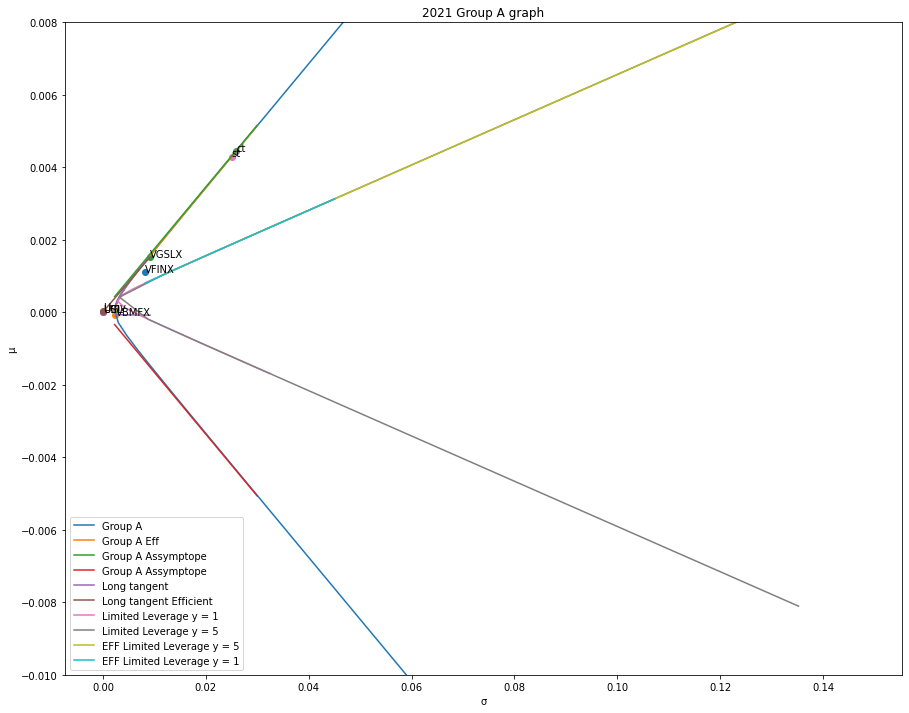

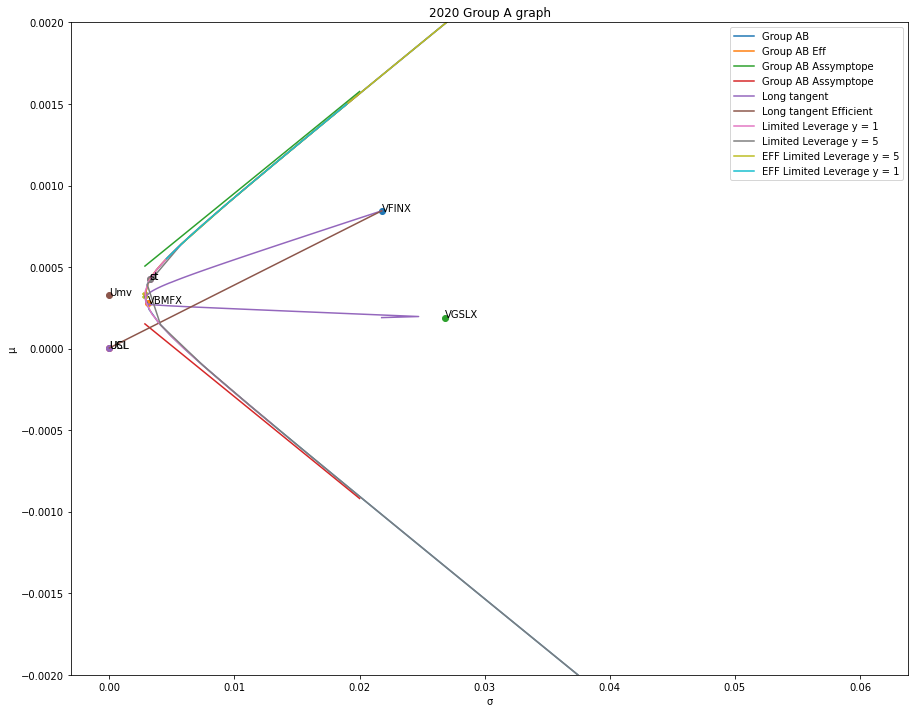

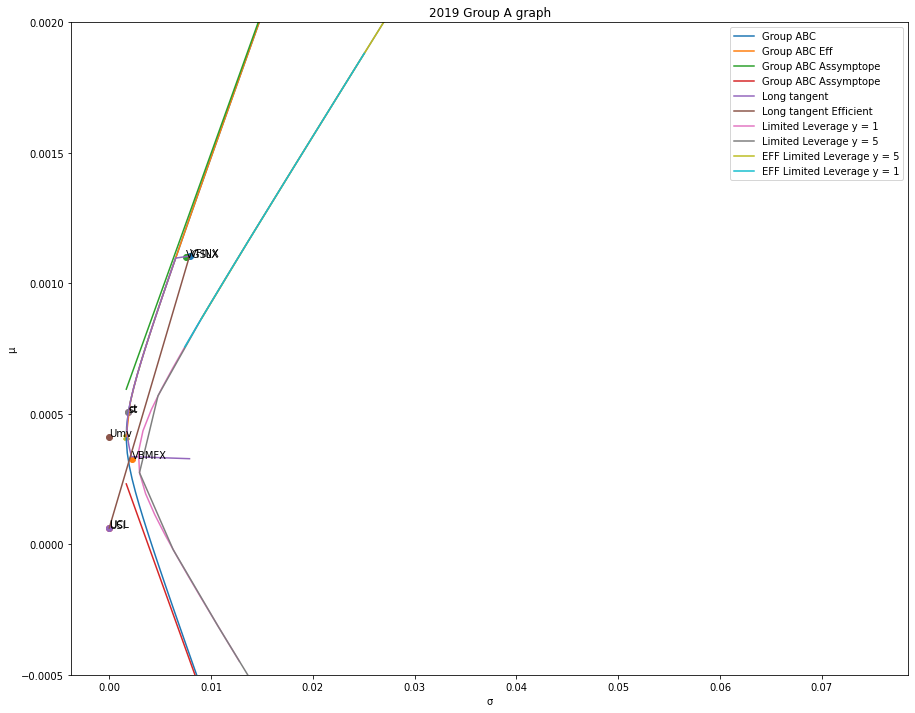

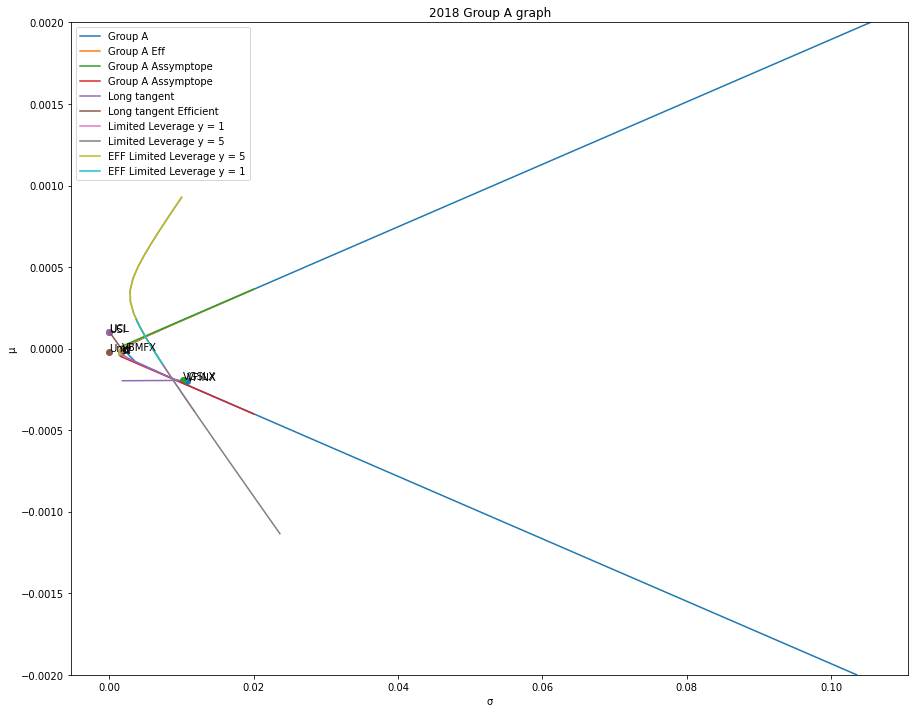

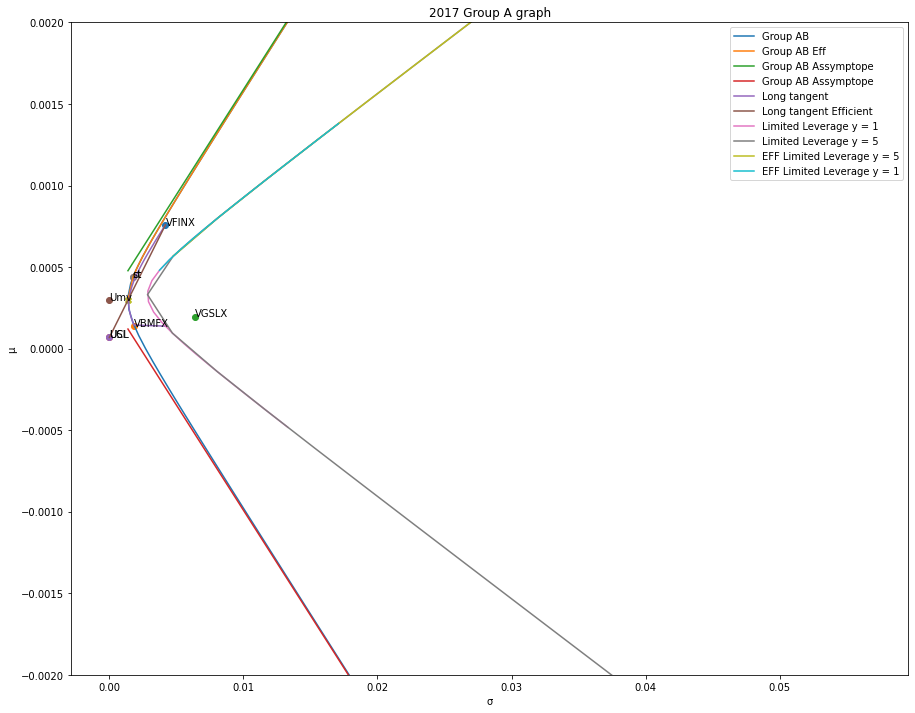

...

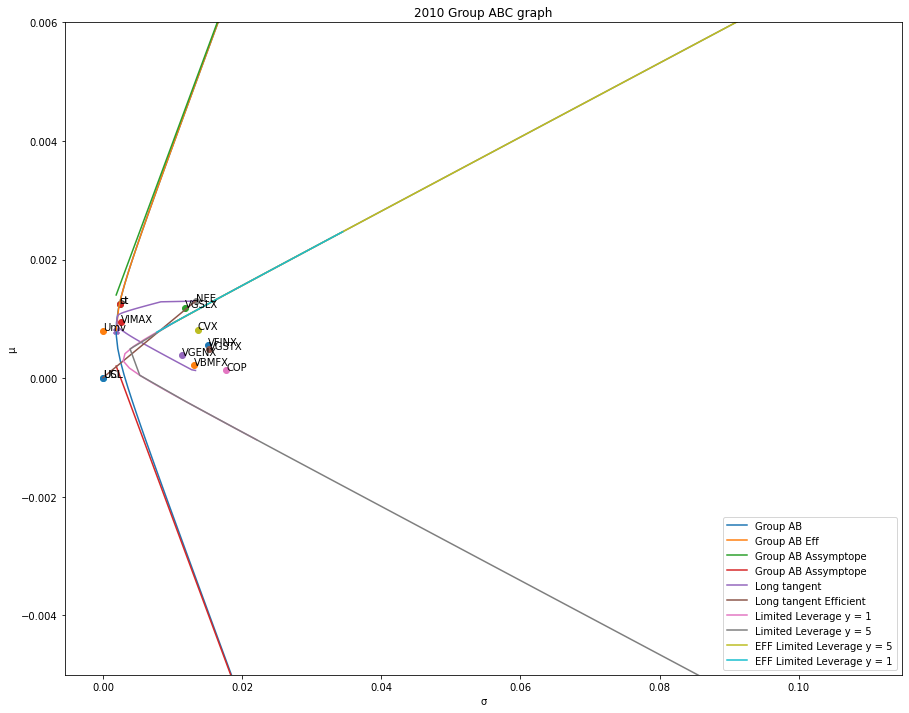

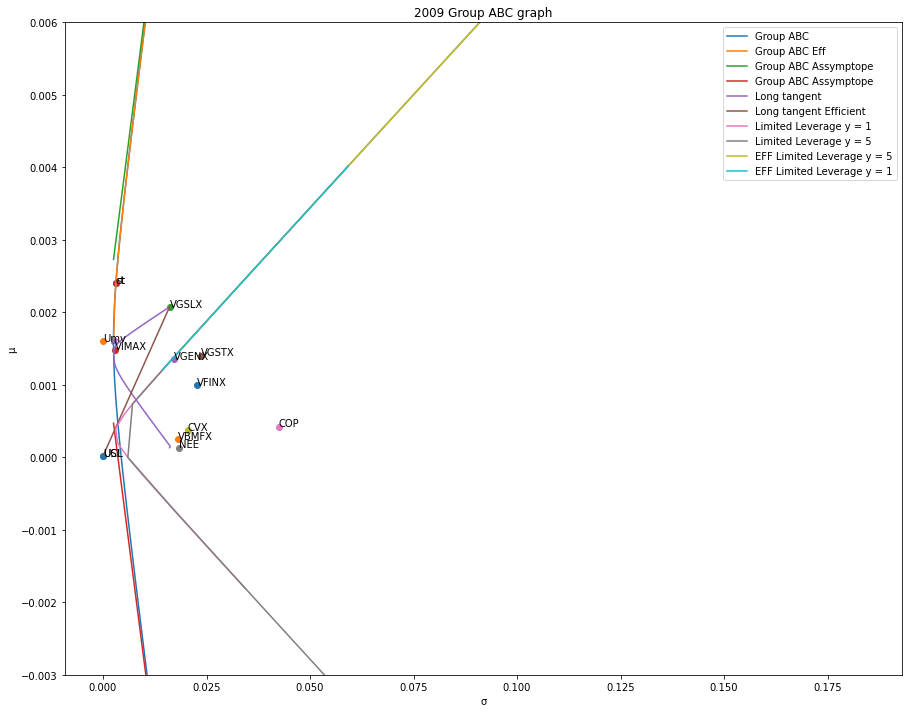

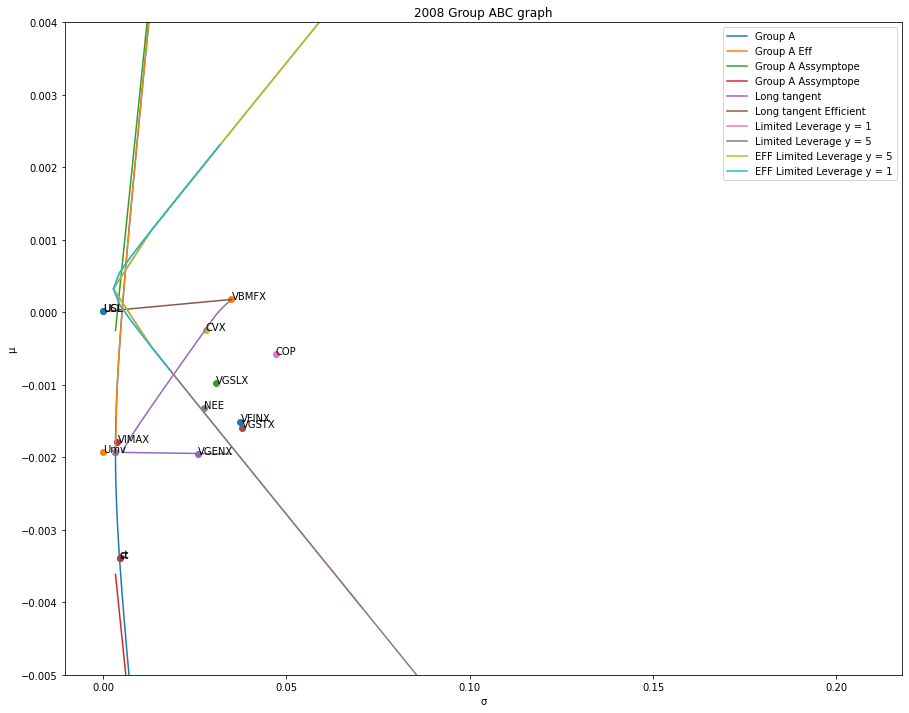

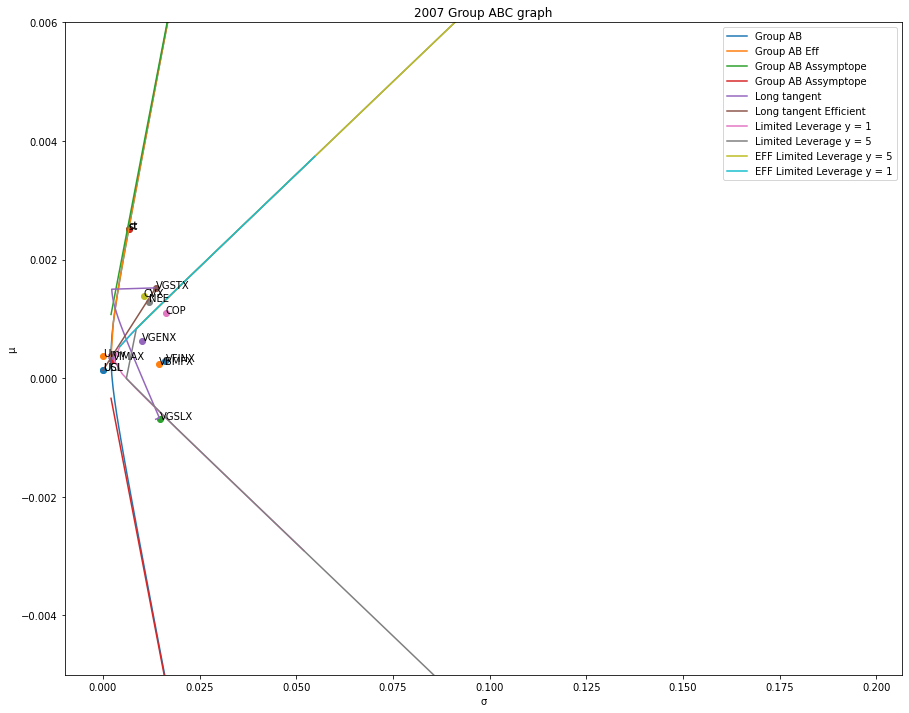

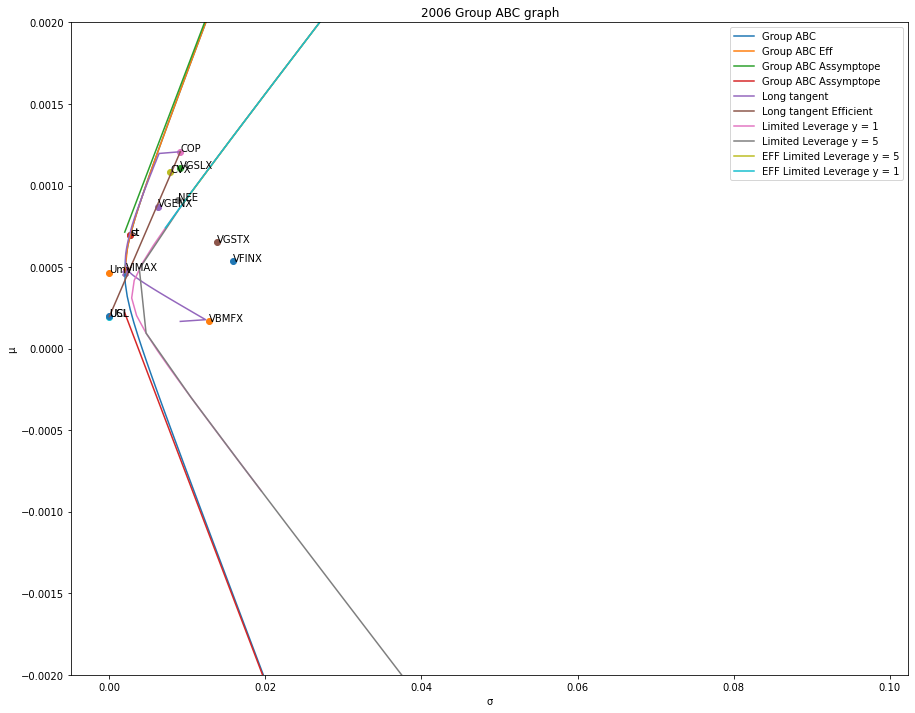

In [108]:
plt.rcParams["figure.figsize"]=(15,12)
grouplabel = ["Group A","Group AB","Group ABC"]

for i in range(48):
  for j in range(len(m1[i])):
    plt.scatter([math.sqrt(v1[i][j][j])],[m1[i][j]])
    plt.annotate(label[j],(math.sqrt(v1[i][j][j]),m1[i][j]))

  y = np.linspace(ymin[i],ymax[i],51)
  xe = np.linspace(o[i],xmax[i%16],51)   
    
  plt.plot(x[i],y,label = grouplabel[i%3])
  plt.plot(xe,ye[i],label = grouplabel[i%3] +" Eff")
  
  plt.plot(xe,yas[i],label = grouplabel[i%3] +" Assymptope")
  plt.plot(xe,yasm[i],label = grouplabel[i%3] +" Assymptope")

  xe = np.linspace(oflt[i],.04,51)
  plt.ylim(ymin[i],ymax[i])

  plt.scatter([0],[usi[i%16]])
  plt.scatter([0],[ucl[i%16]])
  plt.scatter([0],[u[i]])
  plt.annotate('USI',(0,usi[i%16]))
  plt.annotate('UCL',(0,ucl[i%16]))
  plt.annotate('Umv',(0,u[i]))
  plt.scatter([os[i]],[us[i]])
  plt.annotate('st',(os[i],us[i]))
  plt.scatter([oc[i]],[uc[i]])
  plt.annotate('ct',(oc[i],uc[i]))

  plt.scatter(o[i],u[i],marker  = "X")

  yflt = np.linspace(umnc[i],umxc[i],100)
  xflt = oflfc[i]

  plt.plot(xflt,yflt,label = 'Long tangent')

  xflt = np.linspace(0,omx[i],100)
  yflt = usi[i%16] + (((umxc[i] - usi[i%16])/omx[i])*xflt)

  plt.plot(xflt,yflt,label = 'Long tangent Efficient')

#RIGHTE HERE
  plt.plot(coord_1x[i],coord_1y[i], label = 'Limited Leverage y = 1')
  plt.plot(coord_5x[i],coord_5y[i], label = 'Limited Leverage y = 5')
  plt.plot(effs_5x[i],effs_5y[i],label = 'EFF Limited Leverage y = 5')
  plt.plot(effs_1x[i],effs_1y[i],label = 'EFF Limited Leverage y = 1')

  plt.legend()

  plt.title(str(2021 - i%16) + " " + grouplabel[math.floor(i/16)] + " graph")
  plt.xlabel('σ')
  plt.ylabel('µ')
  plt.show()





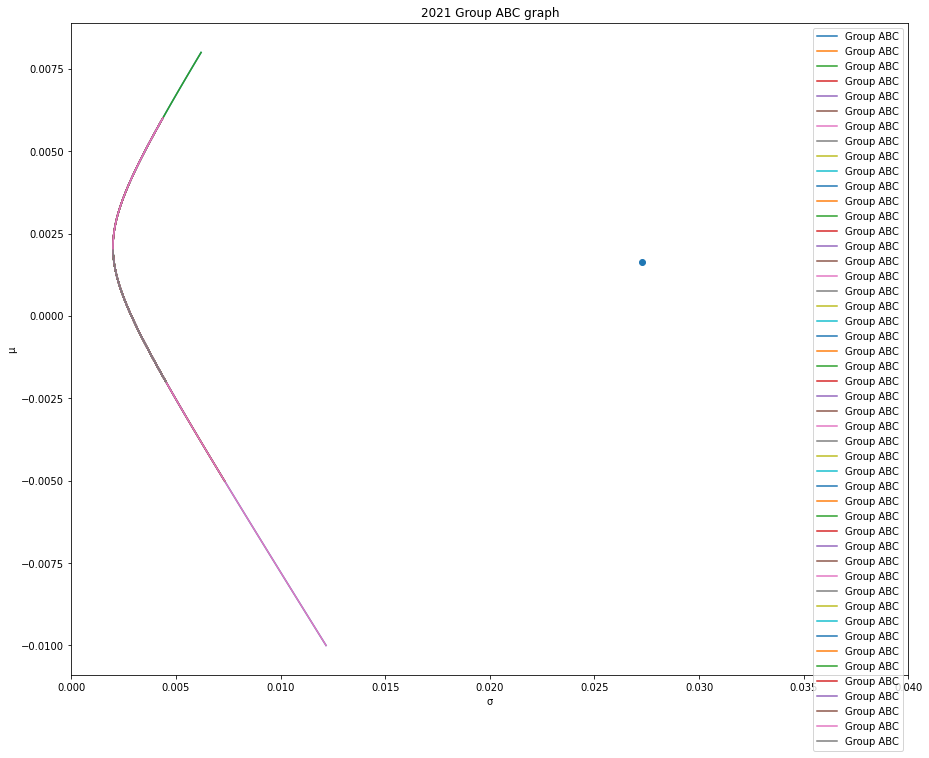

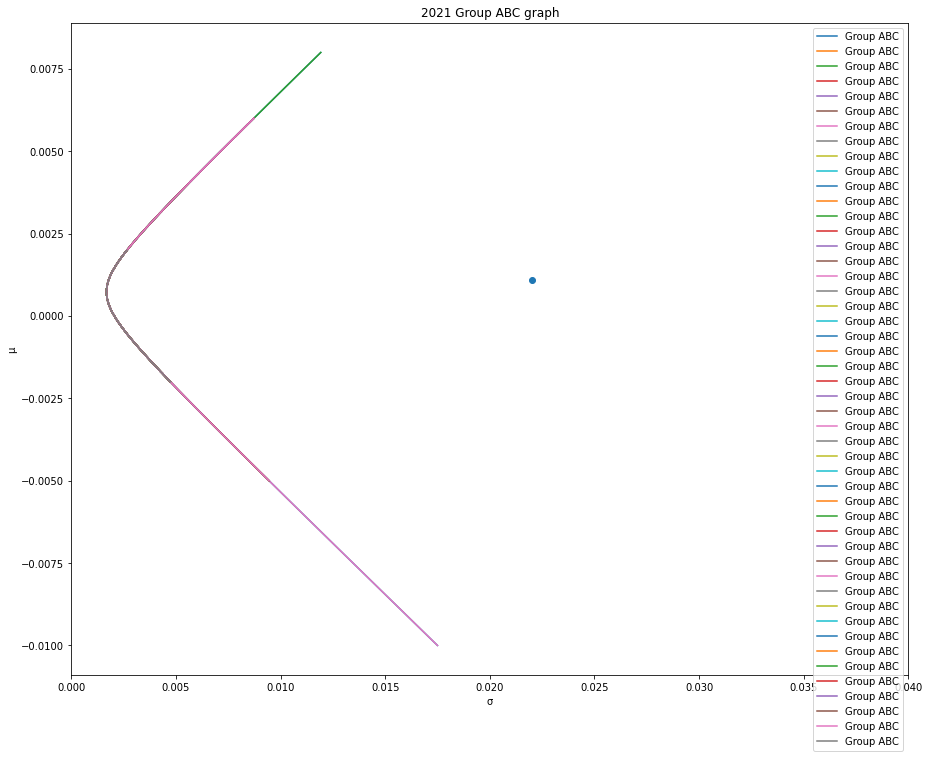

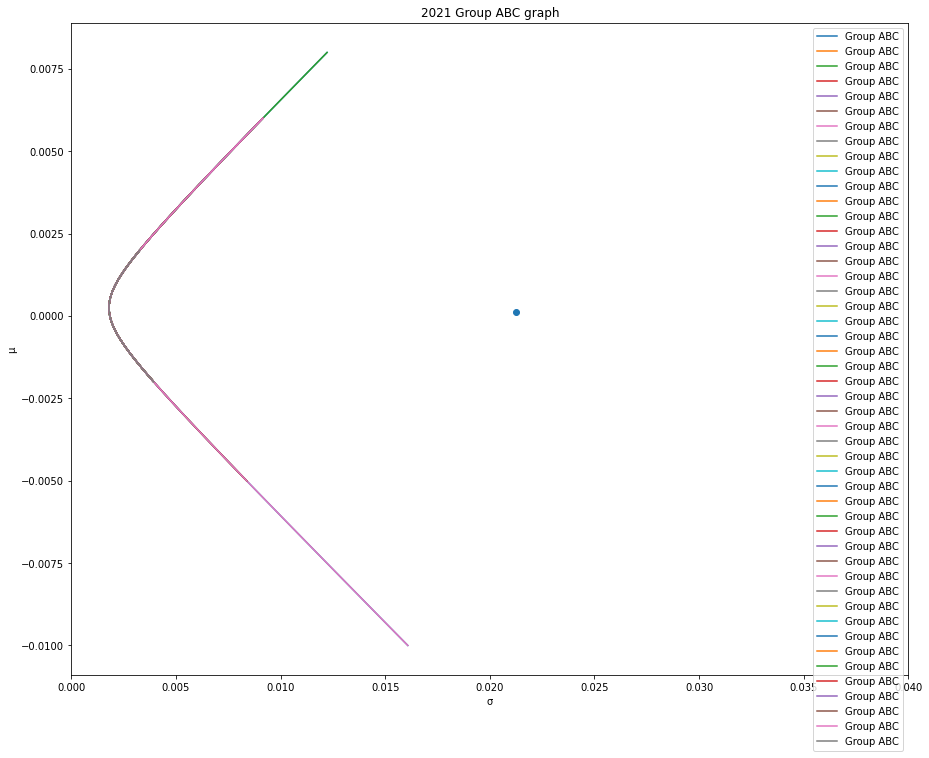

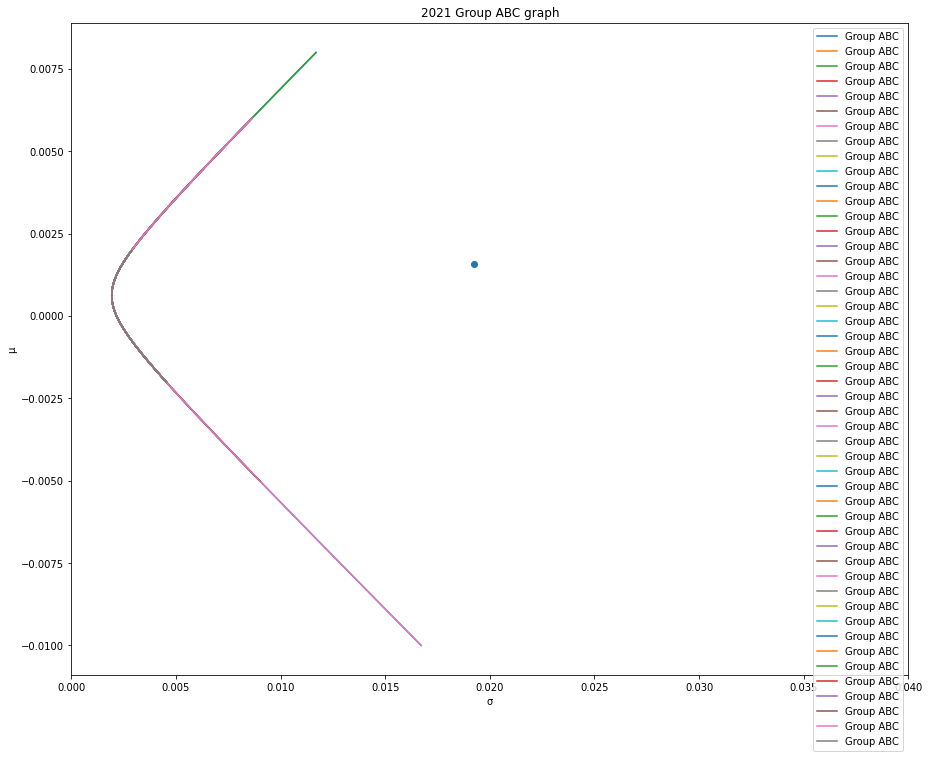

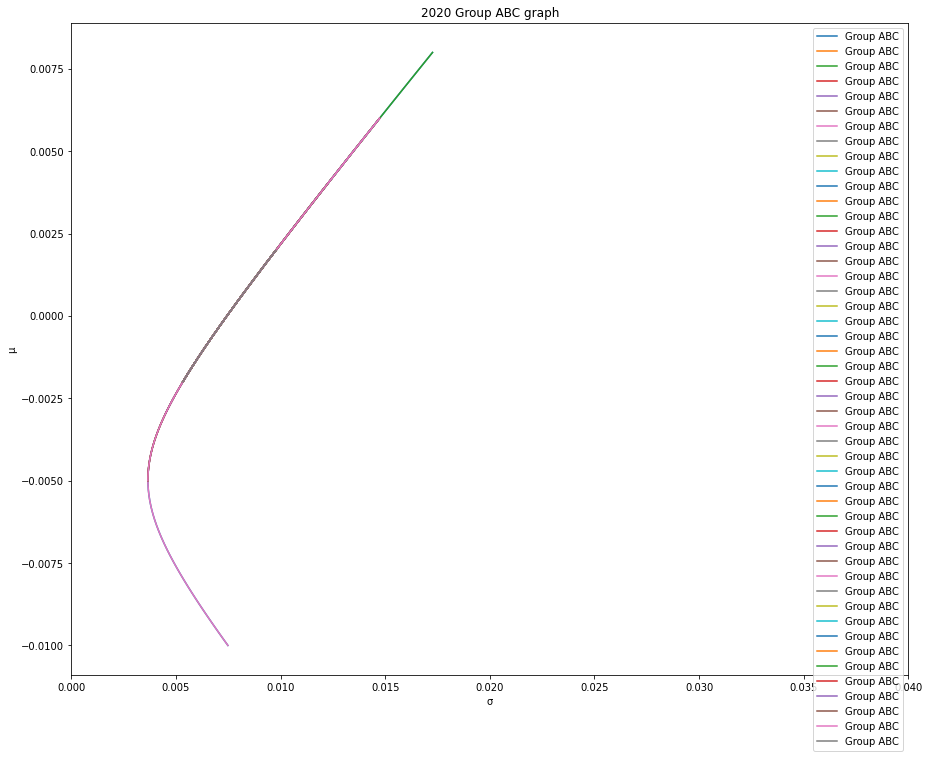

...

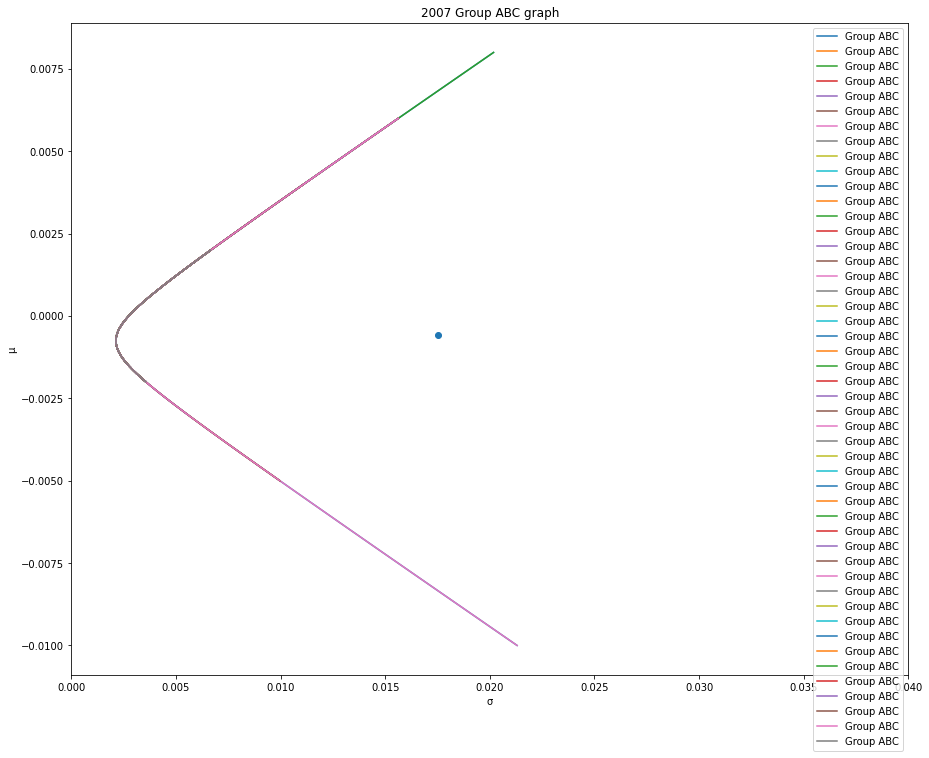

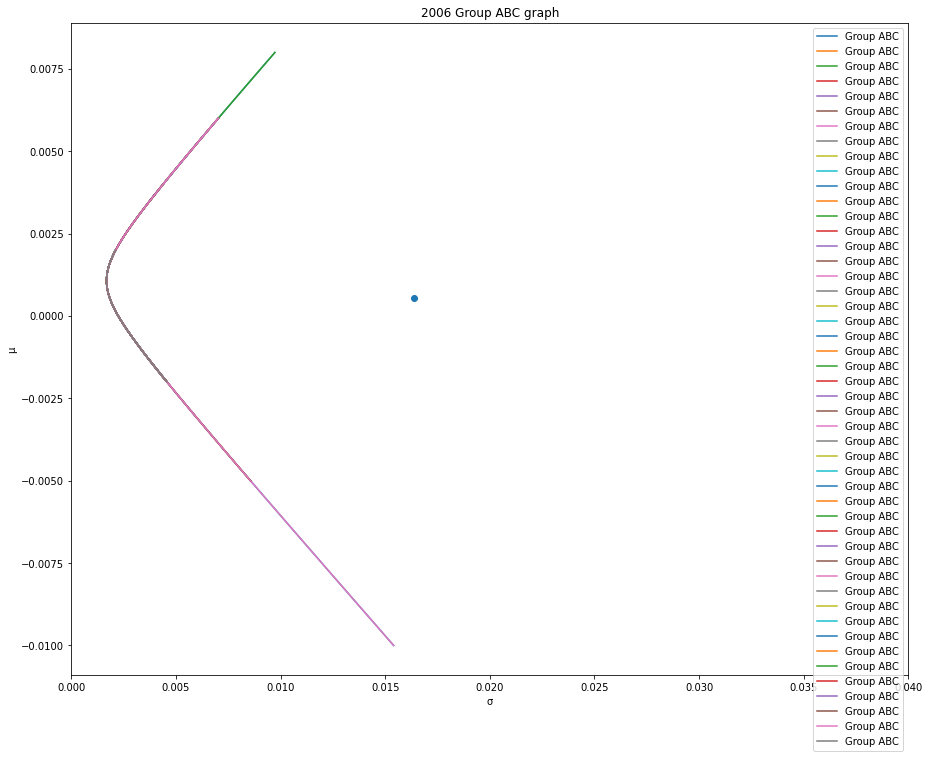

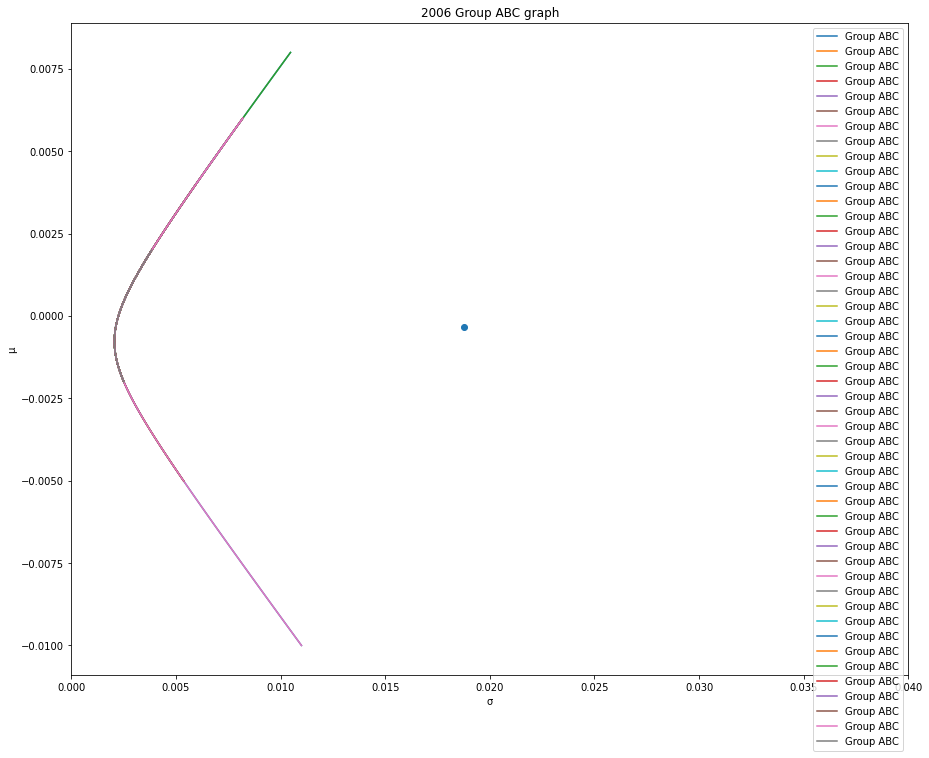

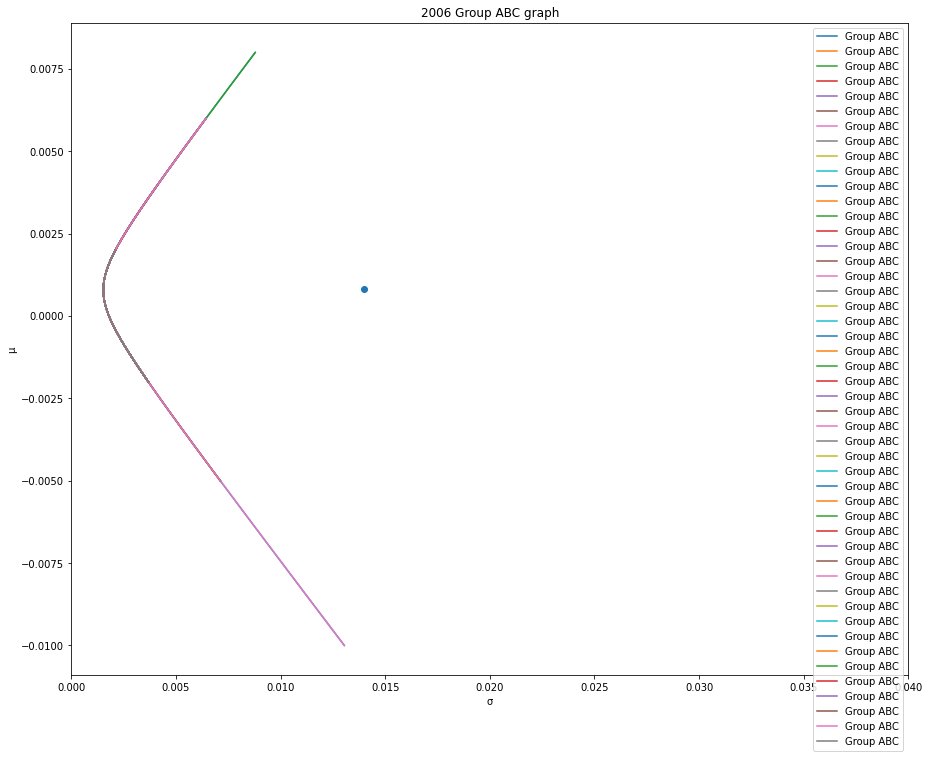

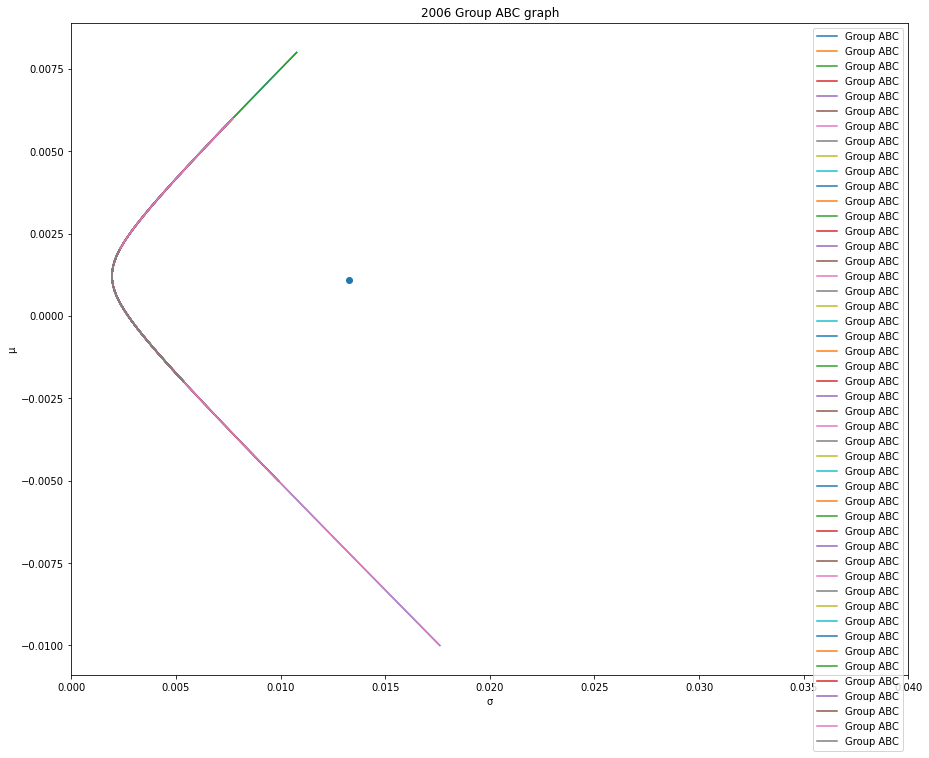

In [109]:

plt.rcParams["figure.figsize"]=(15,12)
grouplabel = ["Group A","Group AB","Group ABC"]



x = []

np.set_printoptions(suppress=False)
for i in range(16):
  for k in range(4):
    y = np.linspace(ymin,ymax,100)
    x.append(np.sqrt(((y - roll_u[i][2][k])/roll_v[i][2][k])**2 + roll_o[i][2][k]**2))  
counter = 0;

for i in range(16):
  for k in range(4):
    plt.scatter([math.sqrt(rollvarf[i][k][0][0])],[roll_means[i][2][k][0]])
    y = np.linspace(ymin,ymax,100)

    plt.plot(x[counter],y,label = grouplabel[2])
    plt.legend()
    plt.xlim(0,.04)
    plt.title(str(2021 - math.floor(counter/4)) + " " + grouplabel[2] + " graph")
    counter = counter + 1
    plt.xlabel('σ')
    plt.ylabel('µ')
    plt.show()

 # plt.plot(xflt[i],y,label = "Group A Long portfolio")
  #plt.plot(xflv[i],y,label = "Group A Leverage portfolio")
  #plt.plot(xe,yeflt[i],label = "Group A Long Eff")








All three Markowitz frontiers for each year are fairly similar. The efficient frontiers are the upper half of the Markowitz frontier, with a little bit of variance likely due to small issues with matplotlib. The more assets in a group, the lower the return and volatility. Generally, the assets with stocks are close together, with bond and real estate assets lower in both volatility and returns. The singular stocks (COP,NEE,CVX) are higher in both volatility and returns.
The long portfolios don't seem to be graphin properly, I assume this is because I had an error in the formula I used to calculate mean and variance for the long tangent portolios. 

In [110]:
stability = np.zeros((64))
counter = 0
for i in range(16):
  for j in range(4):
    stability[counter] = 1/(math.sqrt(1 + ((roll_u[i][2][j] - usi[i%16])**2)/(roll_v[i][2][j]**2 * roll_o[i][2][j]**2) ))
    counter = counter + 1;
stability = stability[::-1]

In [111]:
stabilityAB = np.zeros((64))
counter = 0
for i in range(16):
  for j in range(4):
    stabilityAB[counter] = 1/(math.sqrt(1 + ((roll_u[i][1][j] - usi[i%16])**2)/(roll_v[i][1][j]**2 * roll_o[i][1][j]**2) ))
    counter = counter + 1;
stabilityAB = stabilityAB[::-1]

In [112]:
stabilityA = np.zeros((64))
counter = 0
for i in range(16):
  for j in range(4):
    stabilityA[counter] = 1/(math.sqrt(1 + ((roll_u[i][0][j] - usi[i%16])**2)/(roll_v[i][0][j]**2 * roll_o[i][0][j]**2) ))
    counter = counter + 1;
stabilityA = stabilityA[::-1]

In [113]:
Amaxff = np.zeros(64)
counter = 0
for j in range(16):
  for k in range(4):
    Amaxff[counter] = Amaxf[j][k]
    counter = counter + 1;
Amaxff = Amaxff[::-1]

In [114]:
rolling = []
for i in range(16):
  for k in range(4):
    rolling.append(roll_means[i][2][k][0])


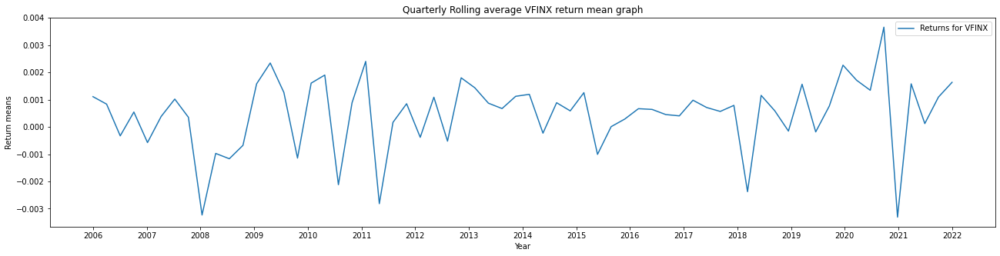

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


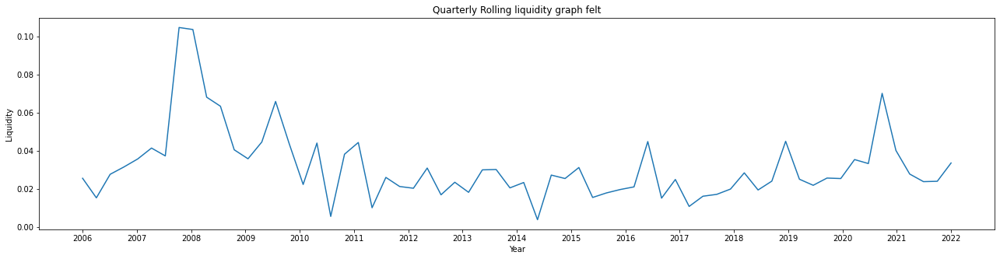

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


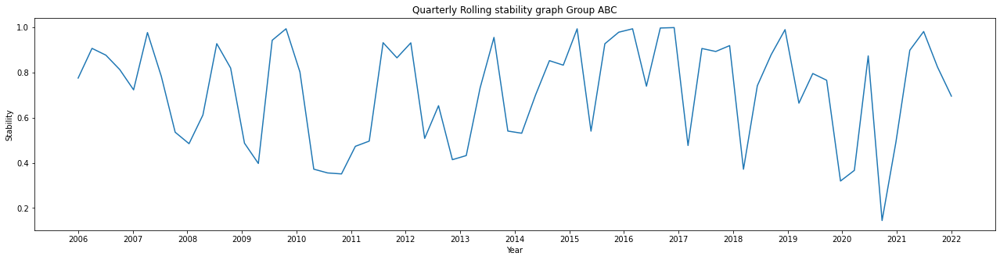

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:43: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


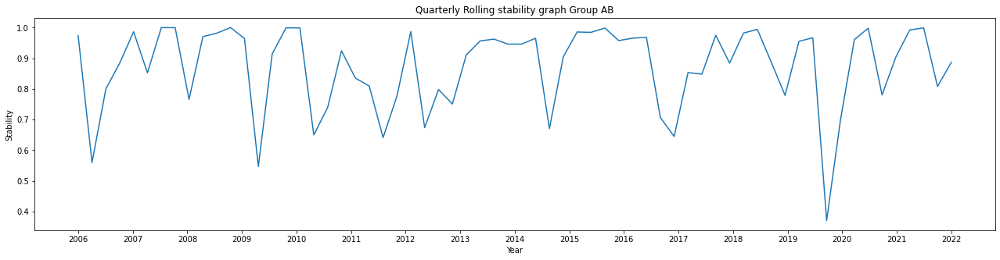

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:55: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


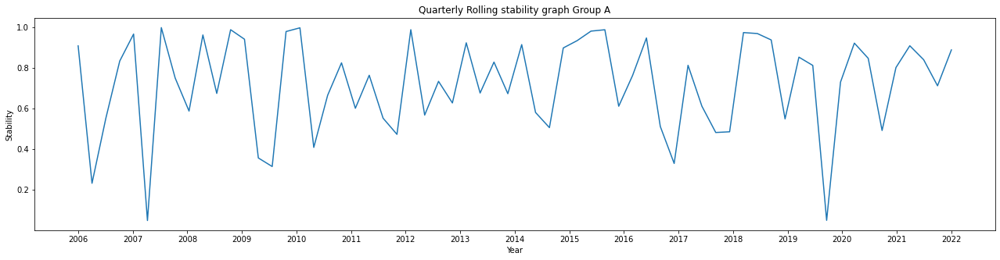

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:68: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


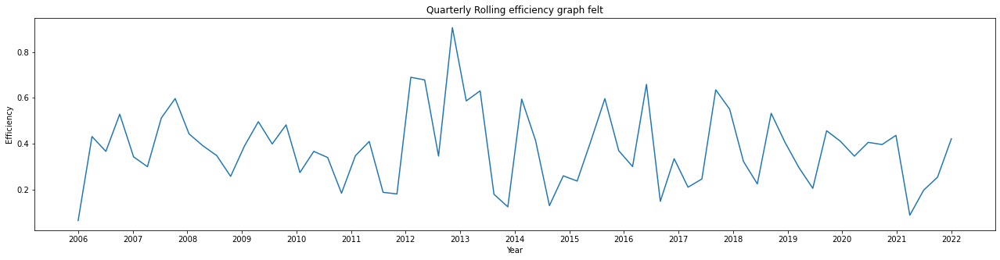

In [115]:
plt.rcParams["figure.figsize"]=(22,5)

rolling = rolling[::-1]
xe = np.linspace(0,64,64)
ax = plt.axes()
ax.set_xticks([0,4,8,12,16,20,24,28,32,36,40,44,48,52,56,60,64])
ax.set_xticklabels(['2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021','2022'])
plt.plot(xe,rolling,label = "Returns for VFINX")
plt.legend()

plt.title("Quarterly Rolling average VFINX return mean graph")
plt.xlabel('Year')
plt.ylabel('Return means')
plt.show()
plt.rcParams["figure.figsize"]=(22,5)

xe = np.linspace(0,64,64)
plt.plot(xe,Amaxff)
ax = plt.axes()
ax.set_xticks([0,4,8,12,16,20,24,28,32,36,40,44,48,52,56,60,64])
ax.set_xticklabels(['2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021','2022'])


plt.title("Quarterly Rolling liquidity graph felt")
plt.xlabel('Year')
plt.ylabel('Liquidity')
plt.show()

xe = np.linspace(0,64,64)
plt.plot(xe,stability)
ax = plt.axes()
ax.set_xticks([0,4,8,12,16,20,24,28,32,36,40,44,48,52,56,60,64])
ax.set_xticklabels(['2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021','2022'])


plt.title("Quarterly Rolling stability graph Group ABC")
plt.xlabel('Year')
plt.ylabel('Stability')
plt.show()
plt.rcParams["figure.figsize"]=(22,5)
xe = np.linspace(0,64,64)
plt.plot(xe,stabilityAB)
ax = plt.axes()
ax.set_xticks([0,4,8,12,16,20,24,28,32,36,40,44,48,52,56,60,64])
ax.set_xticklabels(['2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021','2022'])


plt.title("Quarterly Rolling stability graph Group AB")
plt.xlabel('Year')
plt.ylabel('Stability')
plt.show()
plt.rcParams["figure.figsize"]=(22,5)
xe = np.linspace(0,64,64)
plt.plot(xe,stabilityA)
ax = plt.axes()
ax.set_xticks([0,4,8,12,16,20,24,28,32,36,40,44,48,52,56,60,64])
ax.set_xticklabels(['2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021','2022'])


plt.title("Quarterly Rolling stability graph Group A")
plt.xlabel('Year')
plt.ylabel('Stability')
plt.show()
plt.rcParams["figure.figsize"]=(22,5)
xe = np.linspace(0,64,64)
uefff = uefff[::-1]
plt.plot(xe,uefff)
ax = plt.axes()
ax.set_xticks([0,4,8,12,16,20,24,28,32,36,40,44,48,52,56,60,64])
ax.set_xticklabels(['2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021','2022'])


plt.title("Quarterly Rolling efficiency graph felt")
plt.xlabel('Year')
plt.ylabel('Efficiency')
plt.show()